<a href="https://colab.research.google.com/github/kimsunghooon/Course-DeepLearning/blob/main/Deep_Learning_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
## GPU가 활성화 되었는지 확인
!nvidia-smi

Tue Nov 29 02:59:54 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0    30W /  70W |    312MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
## Tensorflow 활용을 위해 Tensorflow package를 import 
import tensorflow as tf

In [ ]:
## Tensorflow는 CPU버전도 있기에 Deep Learning 모델 개발에 앞서 Tensorflow의 GPU 사용 여부를 확인
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Found GPU at: /device:GPU:0


In [ ]:
## Tensorflow 버전을 확인
tf.__version__

'2.9.2'

# 딥러닝 강의 8주차

### 1. eager execution

In [ ]:
## eager execution : Tensorflow의 메소드들을 바로 실행하는 모드 확인
print(tf.executing_eagerly())

True


In [ ]:
a = 1
b = 2
c = tf.math.add(a, b)
print(c)

tf.Tensor(3, shape=(), dtype=int32)


In [ ]:
c.numpy()

3

### 2. Scalar

In [ ]:
## Tensorflow 활용을 위해 Tensorflow package를 import 
import tensorflow as tf

In [ ]:
# 스칼라 정의하기
a = tf.constant(1)
b = tf.constant(2)
print("a:", a)
print("b:", b)

a: tf.Tensor(1, shape=(), dtype=int32)
b: tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 랭크 확인하기
print(tf.rank(a))

tf.Tensor(0, shape=(), dtype=int32)


In [ ]:
# 자료형 변환
a = tf.cast(a, tf.float32)
b = tf.cast(b, tf.float32)
print(a.dtype)
print(b.dtype)

<dtype: 'float32'>
<dtype: 'float32'>


In [ ]:
# 덧셈
a = tf.constant(1)
b = tf.constant(2)
c = tf.math.add(a, b)
print("result:", c)
print("rank:", tf.rank(c))

# 파이썬 연산자 덧셈
print(a + b)

result: tf.Tensor(3, shape=(), dtype=int32)
rank: tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(3, shape=(), dtype=int32)


In [ ]:
# 뺄셈
a = tf.constant(1)
b = tf.constant(2)
print( tf.math.subtract(a, b) )

# 파이썬 연산자 뺄셈
print(a - b)

tf.Tensor(-1, shape=(), dtype=int32)
tf.Tensor(-1, shape=(), dtype=int32)


In [ ]:
# 곱셈
a = tf.constant(1)
b = tf.constant(2)
print( tf.math.multiply(a, b) )

# 파이썬 연산자 곱셈
print(a * b)

tf.Tensor(2, shape=(), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 나눗셈
a = tf.constant(1)
b = tf.constant(2)
print( tf.math.divide(a, b) )

# 파이썬 연산자 나눗셈
print(a / b)

tf.Tensor(0.5, shape=(), dtype=float64)
tf.Tensor(0.5, shape=(), dtype=float64)


In [ ]:
# 나눗셈 (나머지)
a = tf.constant(1)
b = tf.constant(2)
print( tf.math.mod(a, b) )

# 파이썬 연산자 나눗셈 (나머지)
print(a % b)

tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)


In [ ]:
# 나눗셈 (몫)
a = tf.constant(1)
b = tf.constant(2)
print( tf.math.floordiv(a, b) )

# 파이썬 연산자 나눗셈 (몫)
print(a // b)

tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)


### 3. Vector

In [ ]:
# 라이브러리 불러오기
import tensorflow as tf
import numpy as np

# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 텐서 출력
print("vec1:", vec1)
print("vec2:", vec2)

vec1: tf.Tensor([10. 20. 30.], shape=(3,), dtype=float32)
vec2: tf.Tensor([10. 10. 10.], shape=(3,), dtype=float32)


In [ ]:
# 랭크 확인
print(tf.rank(vec1))
print(tf.rank(vec2))

tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 덧셈 함수
add1 = tf.math.add(vec1, vec2)
print("result:", add1)
print("rank:", tf.rank(add1))

result: tf.Tensor([20. 30. 40.], shape=(3,), dtype=float32)
rank: tf.Tensor(1, shape=(), dtype=int32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 덧셈 연산자
add2 = vec1 + vec2
print("result:", add2)
print("rank:", tf.rank(add2))

result: tf.Tensor([20. 30. 40.], shape=(3,), dtype=float32)
rank: tf.Tensor(1, shape=(), dtype=int32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# tf.math 모듈 함수
print(tf.math.subtract(vec1, vec2)) # 뺄셈
print(tf.math.multiply(vec1, vec2)) # 곱셉
print(tf.math.divide(vec1, vec2)) # 나눗셈
print(tf.math.mod(vec1, vec2)) # 나머지
print(tf.math.floordiv(vec1, vec2)) # 몫

tf.Tensor([ 0. 10. 20.], shape=(3,), dtype=float32)
tf.Tensor([100. 200. 300.], shape=(3,), dtype=float32)
tf.Tensor([1. 2. 3.], shape=(3,), dtype=float32)
tf.Tensor([0. 0. 0.], shape=(3,), dtype=float32)
tf.Tensor([1. 2. 3.], shape=(3,), dtype=float32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 파이썬 연산자
print(vec1 - vec2) # 뺄셈
print(vec1 * vec2) # 곱셉
print(vec1 / vec2) # 나눗셈
print(vec1 % vec2) # 나머지
print(vec1 // vec2) # 몫

tf.Tensor([ 0. 10. 20.], shape=(3,), dtype=float32)
tf.Tensor([100. 200. 300.], shape=(3,), dtype=float32)
tf.Tensor([1. 2. 3.], shape=(3,), dtype=float32)
tf.Tensor([0. 0. 0.], shape=(3,), dtype=float32)
tf.Tensor([1. 2. 3.], shape=(3,), dtype=float32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 벡터 요소합 구하기
print ( tf.reduce_sum(vec1) )
print ( tf.reduce_sum(vec2) )

tf.Tensor(60.0, shape=(), dtype=float32)
tf.Tensor(30.0, shape=(), dtype=float32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 벡터 요소 거듭제곱
print( tf.math.square(vec1) )

tf.Tensor([100. 400. 900.], shape=(3,), dtype=float32)


In [ ]:
# 1차원 배열 정의 
py_list = [10., 20., 30.] # 파이썬 리스트 활용

# 텐서 변환
vec1 = tf.constant(py_list, dtype=tf.float32)

# 거듭제곱 (파이썬 연산자)
print(vec1**2)

tf.Tensor([ 99.99999 400.      899.99994], shape=(3,), dtype=float32)


In [ ]:
# 1차원 배열 정의 
num_arr = np.array([10., 10., 10.]) # 넘파이 배열 활용

# 텐서 변환
vec2 = tf.constant(num_arr, dtype=tf.float32)

# 벡터 요소 제곱근
print( tf.math.sqrt(vec2) )

# 제곱근 (파이썬 연산자)
print( vec2**0.5 )

tf.Tensor([3.1622777 3.1622777 3.1622777], shape=(3,), dtype=float32)
tf.Tensor([3.1622777 3.1622777 3.1622777], shape=(3,), dtype=float32)


### 4. Matrix

In [ ]:
# 2차원 배열 정의
list_of_list = [[10, 20], [30, 40]] 

# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list_of_list)

# 랭크 확인
print("rank:", tf.rank(mat1))

# 텐서 출력
print("mat1:", mat1)

rank: tf.Tensor(2, shape=(), dtype=int32)
mat1: tf.Tensor(
[[10 20]
 [30 40]], shape=(2, 2), dtype=int32)


In [ ]:
# 1차원 벡터 2개 정의
vec1 = tf.constant([1, 0])
vec2 = tf.constant([-1, 2])

# 텐서 행렬 생성 방법 2 : 1차원 벡터 2개를 쌓아서서 텐서로 변환 - stack 함수로 1차원 배열을 위아래로 쌓기
mat2 = tf.stack([vec1, vec2])

# 랭크 확인
print("rank:", tf.rank(mat2))

# 텐서 출력하기
print("mat2:", mat2)

rank: tf.Tensor(2, shape=(), dtype=int32)
mat2: tf.Tensor(
[[ 1  0]
 [-1  2]], shape=(2, 2), dtype=int32)


In [ ]:
# 2차원 배열 정의
list1 = [[10, 20], [30, 40]] 
list2 = [[1,0],[-1,2]]
# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list1)
mat2 = tf.constant(list2)

# 행렬곱 연산
mat_mul = tf.matmul(mat1, mat2)
print("result:", mat_mul)
print("rank:", tf.rank(mat_mul))

result: tf.Tensor(
[[-10  40]
 [-10  80]], shape=(2, 2), dtype=int32)
rank: tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 2차원 배열 정의
list1 = [[10, 20], [30, 40]] 
list2 = [[1,0],[-1,2]]
# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list1)
mat2 = tf.constant(list2)

# 행렬 요소곱 element-by-element 연산
element_mul = tf.math.multiply(mat1, mat2)
print("result:", element_mul)
print("rank:", tf.rank(element_mul))

result: tf.Tensor(
[[ 10   0]
 [-30  80]], shape=(2, 2), dtype=int32)
rank: tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 2차원 배열 정의
list1 = [[10, 20], [30, 40]] 
list2 = [[1,0],[-1,2]]
# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list1)
mat2 = tf.constant(list2)

# 행렬 덧셈 연산
add1 = tf.math.add(mat1, mat2)
print("result:", add1)
print("rank:", tf.rank(add1))

result: tf.Tensor(
[[11 20]
 [29 42]], shape=(2, 2), dtype=int32)
rank: tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 2차원 배열 정의
list1 = [[10, 20], [30, 40]] 
list2 = [[1,0],[-1,2]]
# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list1)
mat2 = tf.constant(list2)

# 덧셈 연산자
add2 = mat1 + mat2
print("result:", add2)
print("rank:", tf.rank(add2))

result: tf.Tensor(
[[11 20]
 [29 42]], shape=(2, 2), dtype=int32)
rank: tf.Tensor(2, shape=(), dtype=int32)


In [ ]:
# 2차원 배열 정의
list1 = [[10, 20], [30, 40]] 
list2 = [[1,0],[-1,2]]
# 텐서 행렬 생성 방법 1 : 2차원 배열을 텐서로 변환 - constant 함수에 2차원 배열 입력
mat1 = tf.constant(list1)
mat2 = tf.constant(list2)

# 행렬곱 연산
mat_mul = tf.matmul(mat1, mat2)

# 텐서를 넘파이로 변환
np_arr = mat_mul.numpy()
print(type(np_arr))
print(np_arr)

<class 'numpy.ndarray'>
[[-10  40]
 [-10  80]]


### 5. Tensor

In [ ]:
# 2차원 배열 정의
mat1 = [[1, 2, 3, 4], 
        [5, 6, 7, 8]]
 
mat2 = [[9, 10, 11, 12],
        [13, 14, 15, 16]]   

mat3 = [[17, 18, 19, 20],
        [21, 22, 23, 24]]    

# 텐서 변환 - constant 함수에 3차원 배열 입력
tensor1 = tf.constant([mat1, mat2, mat3])

# 랭크 확인
print("rank:", tf.rank(tensor1))

# 텐서 출력
print("tensor1:", tensor1)

rank: tf.Tensor(3, shape=(), dtype=int32)
tensor1: tf.Tensor(
[[[ 1  2  3  4]
  [ 5  6  7  8]]

 [[ 9 10 11 12]
  [13 14 15 16]]

 [[17 18 19 20]
  [21 22 23 24]]], shape=(3, 2, 4), dtype=int32)


In [ ]:
# 텐서 변환 - stack 함수로 2차원 배열을 위아래로 쌓기
tensor2 = tf.stack([mat1, mat2, mat3])

# 랭크 확인
print("rank:", tf.rank(tensor2))

# 텐서 출력
print("tensor2:", tensor2)

rank: tf.Tensor(3, shape=(), dtype=int32)
tensor2: tf.Tensor(
[[[ 1  2  3  4]
  [ 5  6  7  8]]

 [[ 9 10 11 12]
  [13 14 15 16]]

 [[17 18 19 20]
  [21 22 23 24]]], shape=(3, 2, 4), dtype=int32)


In [ ]:
# 1차원 배열 정의
vec1 = [1, 2, 3, 4] 
vec2 = [5, 6, 7, 8] 
vec3 = [9, 10, 11, 12]  
vec4 = [13, 14, 15, 16] 
vec5 = [17, 18, 19, 20] 
vec6 = [21, 22, 23, 24] 

# 1차원 배열을 원소로 갖는 2차원 배열 정의
arr = [[vec1, vec2],
        [vec3, vec4],
        [vec5, vec6]]

# 텐서 변환
tensor3 = tf.constant(arr)

# 랭크 확인
print("rank:", tf.rank(tensor3))

# 텐서 출력
print("tensor3:", tensor3)

rank: tf.Tensor(3, shape=(), dtype=int32)
tensor3: tf.Tensor(
[[[ 1  2  3  4]
  [ 5  6  7  8]]

 [[ 9 10 11 12]
  [13 14 15 16]]

 [[17 18 19 20]
  [21 22 23 24]]], shape=(3, 2, 4), dtype=int32)


In [ ]:
# 랭크-4 텐서 만들기
tensor4 = tf.stack([tensor1, tensor2])

# 랭크 확인
print("rank:", tf.rank(tensor4))

# 텐서 출력
print("tensor4:", tensor4)

rank: tf.Tensor(4, shape=(), dtype=int32)
tensor4: tf.Tensor(
[[[[ 1  2  3  4]
   [ 5  6  7  8]]

  [[ 9 10 11 12]
   [13 14 15 16]]

  [[17 18 19 20]
   [21 22 23 24]]]


 [[[ 1  2  3  4]
   [ 5  6  7  8]]

  [[ 9 10 11 12]
   [13 14 15 16]]

  [[17 18 19 20]
   [21 22 23 24]]]], shape=(2, 3, 2, 4), dtype=int32)


### 6. Indexing

In [ ]:
# 벡터 정의하기
vec = tf.constant([10, 20, 30, 40, 50])
print(vec)

tf.Tensor([10 20 30 40 50], shape=(5,), dtype=int32)


In [ ]:
print(vec[0])

tf.Tensor(10, shape=(), dtype=int32)


In [ ]:
print(vec[-1])

tf.Tensor(50, shape=(), dtype=int32)


In [ ]:
print(vec[:3])

tf.Tensor([10 20 30], shape=(3,), dtype=int32)


In [ ]:
# 행렬 정의하기
mat = tf.constant([[10, 20, 30], 
                    [40, 50, 60]])

print(mat)

tf.Tensor(
[[10 20 30]
 [40 50 60]], shape=(2, 3), dtype=int32)


In [ ]:
mat = tf.constant([[10, 20, 30], 
                    [40, 50, 60]])

# indexing
print(mat[0, 2])

tf.Tensor(30, shape=(), dtype=int32)


In [ ]:
mat = tf.constant([[10, 20, 30], 
                    [40, 50, 60]])

# indexing
print(mat[0, :])

tf.Tensor([10 20 30], shape=(3,), dtype=int32)


In [ ]:
mat = tf.constant([[10, 20, 30], 
                    [40, 50, 60]])

# indexing
print(mat[:, 1])

tf.Tensor([20 50], shape=(2,), dtype=int32)


In [ ]:
mat = tf.constant([[10, 20, 30], 
                    [40, 50, 60]])

# indexing
print(mat[:, :])

tf.Tensor(
[[10 20 30]
 [40 50 60]], shape=(2, 3), dtype=int32)


In [ ]:
# 랭크-3 텐서 정의하기
tensor = tf.constant([
    [[10, 20, 30], 
     [40, 50, 60]],
    [[-10, -20, -30], 
     [-40, -50, -60]],   
])
print(tensor)

tf.Tensor(
[[[ 10  20  30]
  [ 40  50  60]]

 [[-10 -20 -30]
  [-40 -50 -60]]], shape=(2, 2, 3), dtype=int32)


In [ ]:
tensor = tf.constant([
    [[10, 20, 30], 
     [40, 50, 60]],
    [[-10, -20, -30], 
     [-40, -50, -60]],   
])
# indexing
print(tensor[0, :, :])

tf.Tensor(
[[10 20 30]
 [40 50 60]], shape=(2, 3), dtype=int32)


In [ ]:
tensor = tf.constant([
    [[10, 20, 30], 
     [40, 50, 60]],
    [[-10, -20, -30], 
     [-40, -50, -60]],   
])
# indexing
print(tensor[:, :1, :2])

tf.Tensor(
[[[ 10  20]]

 [[-10 -20]]], shape=(2, 1, 2), dtype=int32)


In [ ]:
tensor = tf.constant([
    [[10, 20, 30], 
     [40, 50, 60]],
    [[-10, -20, -30], 
     [-40, -50, -60]],   
])
# indexing
print(tensor[:, :2, :2])

tf.Tensor(
[[[ 10  20]
  [ 40  50]]

 [[-10 -20]
  [-40 -50]]], shape=(2, 2, 2), dtype=int32)


### 7. Reshape

In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))
print(tensor)

tf.Tensor([ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23], shape=(24,), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : 3행 8열
tensor1 = tf.reshape(tensor, [3, 8])
print(tensor1)

tf.Tensor(
[[ 0  1  2  3  4  5  6  7]
 [ 8  9 10 11 12 13 14 15]
 [16 17 18 19 20 21 22 23]], shape=(3, 8), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : ?행, 4열 (-1을 넣으면 전체 원소의 갯수에 맞게 자동으로 설정)
tensor2 = tf.reshape(tensor, [-1, 4])
print(tensor2)

tf.Tensor(
[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]
 [12 13 14 15]
 [16 17 18 19]
 [20 21 22 23]], shape=(6, 4), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : ?행 (-1을 넣으면 전체 원소의 갯수에 맞게 자동으로 설정)
tensor3 = tf.reshape(tensor, [-1])
print(tensor3)

tf.Tensor([ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23], shape=(24,), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : ?차, 3행, 4열 (3행 4열 짜리 행렬을 ?개 만들기) (-1을 넣으면 전체 원소의 갯수에 맞게 자동으로 설정)
tensor4 = tf.reshape(tensor, [-1, 3, 4])
print(tensor4)

tf.Tensor(
[[[ 0  1  2  3]
  [ 4  5  6  7]
  [ 8  9 10 11]]

 [[12 13 14 15]
  [16 17 18 19]
  [20 21 22 23]]], shape=(2, 3, 4), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : 3차, 2행, 4열 (2행 4열 짜리 행렬을 3개 만들기)
tensor5 = tf.reshape(tensor, [3, 2, 4])
print(tensor5)

tf.Tensor(
[[[ 0  1  2  3]
  [ 4  5  6  7]]

 [[ 8  9 10 11]
  [12 13 14 15]]

 [[16 17 18 19]
  [20 21 22 23]]], shape=(3, 2, 4), dtype=int32)


In [ ]:
# 랭크-1 텐서 정의하기
tensor = tf.constant(range(0, 24))

# reshape : 3차차, 2차, 2행, 2열 (2행 2열 짜리 행렬을 2개씩 3개개 만들기)
tensor6 = tf.reshape(tensor, [3, 2, 2, 2])
print(tensor6)

tf.Tensor(
[[[[ 0  1]
   [ 2  3]]

  [[ 4  5]
   [ 6  7]]]


 [[[ 8  9]
   [10 11]]

  [[12 13]
   [14 15]]]


 [[[16 17]
   [18 19]]

  [[20 21]
   [22 23]]]], shape=(3, 2, 2, 2), dtype=int32)


# 딥러닝 강의 9주차

## Simple Linear Regression with Neural Networks

### 데이터셋 만들기

In [ ]:
import numpy as np

# 샘플 데이터셋 생성
x = np.arange(1, 6)

# y=3x+2에 맞는 데이터셋 생성
y=3*x+2
print(x)
print(y)

[1 2 3 4 5]
[ 5  8 11 14 17]


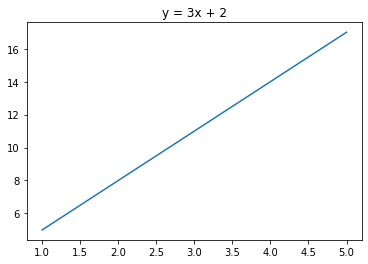

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 샘플 데이터셋 생성
x = np.arange(1, 6)

# y=3x+2에 맞는 데이터셋 생성
y=3*x+2
print(x)
print(y)

# 시각화
plt.plot(x, y)
plt.title('y = 3x + 2')
plt.show()

### 모델구조

In [ ]:
import tensorflow as tf

In [ ]:
# 리스트형
model = tf.keras.Sequential([
    tf.keras.layers.Dense(10), 
    tf.keras.layers.Dense(5), 
    tf.keras.layers.Dense(1), 
])

In [ ]:
# add 함수로 레이어 추가
model = tf.keras.Sequential()
model.add(tf.keras.layers.Dense(10))
model.add(tf.keras.layers.Dense(5))
model.add(tf.keras.layers.Dense(1))

In [ ]:
import tensorflow as tf

In [ ]:
model = tf.keras.Sequential([
    # 입력 데이터의 shape = (150, 4) 인 경우 input_shape 지정 
    tf.keras.layers.Dense(10, input_shape=[4]), 
    tf.keras.layers.Dense(5), 
    tf.keras.layers.Dense(1), 
])

### 선형회귀모형 생성

In [ ]:
# 단순선형회귀 모델 생성
# perceptron 1개인 모델 설계 
# 데이터 차원수 = Feature = 1개 = input_shape = [1]
model = tf.keras.Sequential([
    tf.keras.layers.Dense(1, input_shape=[1])                    
])

In [ ]:
# 모델 요약 : 설계한 모델 확인하기
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________


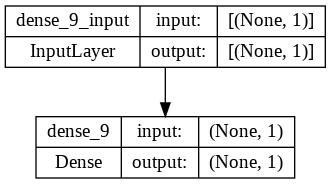

In [ ]:
# 설계한 모델 확인하기 시각적 확인
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
# 클래스 인스턴스 지정
# 모델 컴파일하기
# 속도를 위해 내부적으로 모델의 구조를 확정하는 컴파일일
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.005), 
              loss=tf.keras.losses.MeanAbsoluteError(), 
              metrics=[tf.keras.metrics.MeanAbsoluteError(), 
                       tf.keras.metrics.MeanSquaredError()
                       ])

In [ ]:
# 컴파일
model.compile(optimizer='sgd', loss='mse', metrics=['mae'])

In [ ]:
# 모델 학습하기 - 훈련
# epochs = 몇 세대를 반복 학습할지 정의 
history = model.fit(x, y, epochs=100)

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 56.5355 - mae: 7.1210
Epoch 2/100
1/1 [==============================] - 0s 9ms/step - loss: 33.0964 - mae: 5.4919
Epoch 3/100
1/1 [==============================] - 0s 9ms/step - loss: 19.4363 - mae: 4.2482
Epoch 4/100
1/1 [==============================] - 0s 8ms/step - loss: 11.4748 - mae: 3.2985
Epoch 5/100
1/1 [==============================] - 0s 9ms/step - loss: 6.8342 - mae: 2.5734
Epoch 6/100
1/1 [==============================] - 0s 8ms/step - loss: 4.1290 - mae: 2.0196
Epoch 7/100
1/1 [==============================] - 0s 11ms/step - loss: 2.5515 - mae: 1.5967
Epoch 8/100
1/1 [==============================] - 0s 9ms/step - loss: 1.6312 - mae: 1.2737
Epoch 9/100
1/1 [==============================] - 0s 7ms/step - loss: 1.0939 - mae: 1.0269
Epoch 10/100
1/1 [==============================] - 0s 10ms/step - loss: 0.7799 - mae: 0.8384
Epoch 11/100
1/1 [==============================] - 0s 7ms/step - loss: 0.

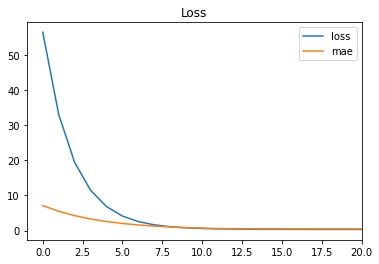

In [ ]:
import matplotlib.pyplot as plt

# 학습 log 시각화하기 
# 20 에포크까지 Loss 수렴에 대한 시각화
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['mae'], label='mae')
plt.xlim(-1, 20)
plt.title('Loss')
plt.legend()
plt.show()

In [ ]:
# 모델 평가하기 (evaluate)
# 검증
model.evaluate(x, y)

1/1 [==============================] - 0s 116ms/step - loss: 0.1860 - mae: 0.3702


[0.18600735068321228, 0.3701820373535156]

In [ ]:
# 모델 예측 하기 (predict)
model.predict([10])


1/1 [==============================] - 0s 29ms/step


array([[33.78913]], dtype=float32)

In [ ]:
# 실제 계산한 값과 비교
# 3 * 10 + 2 = 32
print(3*10+2)

32


## mnist classification with Neural Networks

### 데이터셋 만들기

In [ ]:
import tensorflow as tf

# 케라스의 내장 데이터셋에서 mnist 데이터셋을 로드
mnist = tf.keras.datasets.mnist

In [ ]:
# load_data()로 데이터셋을 로드 합니다.
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
# 로드된 데이터셋 확인
print('train set: ', x_train.shape, y_train.shape)
print('test  set: ', x_test.shape, y_test.shape)

train set:  (60000, 28, 28) (60000,)
test  set:  (10000, 28, 28) (10000,)


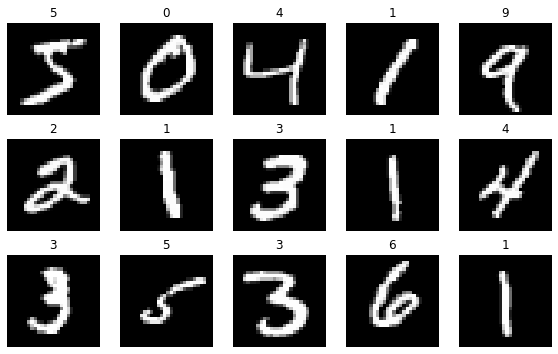

In [ ]:
# 데이터 시각화
import matplotlib.pyplot as plt

# canvas 생성
fig, axes = plt.subplots(3, 5)
fig.set_size_inches(8, 5)

for i in range(15):
    ax = axes[i//5, i%5]
    # imshow로 이미지 시각화
    ax.imshow(x_train[i], cmap='gray')
    ax.axis('off')
    ax.set_title(str(y_train[i]))

plt.tight_layout()
plt.show()

### 데이터 전처리

In [ ]:
# x_train 배열의 데이터 확인
x_train[0, 10:15, 10:15]

array([[  1, 154, 253,  90,   0],
       [  0, 139, 253, 190,   2],
       [  0,  11, 190, 253,  70],
       [  0,   0,  35, 241, 225],
       [  0,   0,   0,  81, 240]], dtype=uint8)

In [ ]:
# 픽셀 값의 최소/최대 값 확인
print(f'정규화 전] 최소값: {x_train.min()}, 최대값: {x_train.max()}')

# 데이터 정규화
# Mnist 데이터 셋은 0~255 scale을 가지므로 전체리가 필요함 
# 정규화를 수행하여 0~1 scale로 데이터 변환 
x_train = x_train / x_train.max()

# 정규화 후 최소/최대 값 확인
print(f'정규화 후] 최소값: {x_train.min()}, 최대값: {x_train.max()}')

정규화 전] 최소값: 0, 최대값: 255
정규화 후] 최소값: 0.0, 최대값: 1.0


In [ ]:
# x_train 배열의 데이터 확인
x_train[0, 10:15, 10:15]

array([[0.00392157, 0.60392157, 0.99215686, 0.35294118, 0.        ],
       [0.        , 0.54509804, 0.99215686, 0.74509804, 0.00784314],
       [0.        , 0.04313725, 0.74509804, 0.99215686, 0.2745098 ],
       [0.        , 0.        , 0.1372549 , 0.94509804, 0.88235294],
       [0.        , 0.        , 0.        , 0.31764706, 0.94117647]])

In [ ]:
# test 셋에도 정규화 동일 적용
x_test = x_test / x_test.max()

### Input 의 2가지 방법

In [ ]:
print(f'변경전 shape: {x_train.shape}')

# [방법 1] reshape을 이용하여, 1차원으로 데이터 변환
print(f'1D으로 shape 변경 후: {x_train.reshape(60000, -1).shape}')

변경전 shape: (60000, 28, 28)
1D으로 shape 변경 후: (60000, 784)


In [ ]:
print(f'변경전 shape: {x_train.shape}')

# [방법 2] Flatten 레이어를 적용하여, 1차원으로 데이터 변환
print(f'Flatten 적용 후: {tf.keras.layers.Flatten()(x_train).shape}')

변경전 shape: (60000, 28, 28)
Flatten 적용 후: (60000, 784)


### 모델 설계

#### 출력 층이 1개 node 인 경우

In [ ]:
# 출력층 노드 1개

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 

    # Hidden Layer 의 Activation 함수 = Relu
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 

    # 출력층 노드 = 1, Activation 함수 =  sigmoid
    tf.keras.layers.Dense(1, activation='sigmoid'), 
])

# 모델 컴파일, 목적함수 = binary_crossentropy
# 이진 분류 (출력 노드 개수 = 1, sigmoid 인 경우)
model.compile(loss='binary_crossentropy')

In [ ]:

# tf.keras.layers.Dense(1, activation='sigmoid')

# # 출력층 노드 = 2개 이상인 경우, softmax
# tf.keras.layers.Dense(10, activation='softmax')

#### 출력 층이 10개 node인 경우

In [ ]:
# 출력층 노드 10개

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 

    # Hidden Layer 의 Activation 함수 = Relu
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'),
    
    # 출력층 노드 = 10, Activation 함수 = softmax
    tf.keras.layers.Dense(10, activation='softmax'), 
])

In [ ]:

# 모델 컴파일, 목적함수 = categorical_crossentropy
model.compile(loss='categorical_crossentropy')
# y가 원 핫 벡터인 경우
# [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]

# # y가 원 핫 벡터가 아니고, 일반 벡터인 경우 목적함수 = sparse_categorical_crossentropy
# model.compile(loss='sparse_categorical_crossentropy')

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_14 (Dense)            (None, 256)               200960    
                                                                 
 dense_15 (Dense)            (None, 64)                16448     
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 dense_17 (Dense)            (None, 10)                330       
                                                                 
Total params: 219,818
Trainable params: 219,818
Non-trainable params: 0
_________________________________________________________________


#### 옵티마이져

In [ ]:
# 모델 컴파일, optimizer = Adam
# 다양한 학습 방법중 Adam 사용 : momentum 과 학습률 동시에 고려
# 학습률 = lr = 0.001
# 클래스 인스턴스로 Adam 정의하는 코드
adam = tf.keras.optimizers.Adam(lr=0.001) 

# 문자열로 Adam 정의하는 코드
model.compile(optimizer=adam)

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


#### 평가 지표

In [ ]:
# 모델 컴파일
# Metric = Accuracy 지정
# 클래스 인스턴스로 Metric = Accuracy 정의하는 코드
acc = tf.keras.metrics.SparseCategoricalAccuracy()

# 문자열로 Metric = Accuracy 정의하는 코드
model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy', 
              metrics=[acc])

### 훈련

In [ ]:
# 훈련
model.fit(x_train, y_train, 
          epochs=10, 
          )

# 아래 결과물의 sparse_categorical_accuracy: ???? 값이 계속 증가 하는 것을 확인할 수 있다.
# accuracy 가 증가하는 것은 정확도가 향상되는 것으로 학습이 잘 되는 것을 의미한다.

Epoch 1/10
1875/1875 [==============================] - 14s 7ms/step - loss: 0.2277 - sparse_categorical_accuracy: 0.9323
Epoch 2/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0943 - sparse_categorical_accuracy: 0.9710
Epoch 3/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0665 - sparse_categorical_accuracy: 0.9794
Epoch 4/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0504 - sparse_categorical_accuracy: 0.9842
Epoch 5/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0393 - sparse_categorical_accuracy: 0.9873
Epoch 6/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0329 - sparse_categorical_accuracy: 0.9895
Epoch 7/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0275 - sparse_categorical_accuracy: 0.9912
Epoch 8/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0255 - sparse_categorical_accuracy: 0.9917
Epoch 9/10
1875/1875 [====

### 테스트

In [ ]:
# 검증
test_loss, test_acc = model.evaluate(x_test,  y_test)

print('검증셋 정확도:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 0.0868 - sparse_categorical_accuracy: 0.9789
검증셋 정확도: 0.9789000153541565


### 예측

In [ ]:
# 예측
predictions = model.predict(x_test)

In [ ]:
# 예측 결과 출력
predictions[0]

array([1.14611876e-08, 9.49558920e-09, 3.54599308e-07, 3.09359734e-06,
       4.19941095e-08, 1.42357194e-07, 1.26290969e-14, 9.99981284e-01,
       3.20161031e-09, 1.51657714e-05], dtype=float32)

In [ ]:
import numpy as np

# 0번 index에 대한 예측 클래스 출력
print(np.argmax(predictions[0]))

7


In [ ]:
import numpy as np

# 0번 index에 대한 예측 클래스 출력
print(np.argmax(predictions[0]))

# 첫 10개 index에 대한 예측 클래스 출력
print(np.argmax(predictions[:10], axis=1))

7
[7 2 1 0 4 1 4 9 5 9]


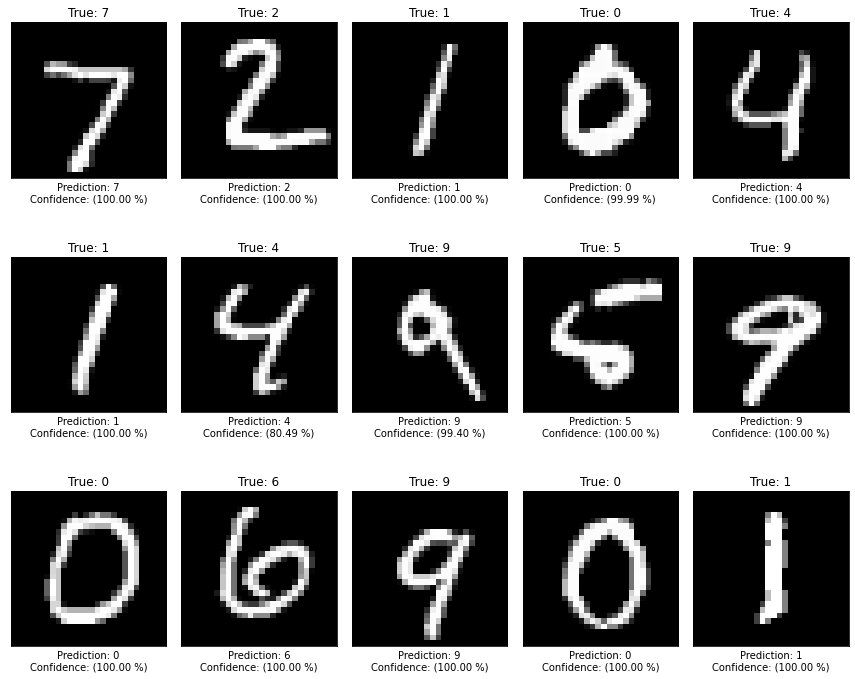

In [ ]:
# 데이터 시각화
import matplotlib.pyplot as plt

def get_one_result(idx):
    img, y_true, y_pred, confidence = x_test[idx], y_test[idx], np.argmax(predictions[idx]), 100*np.max(predictions[idx])
    return img, y_true, y_pred, confidence
    
# canvas 생성
fig, axes = plt.subplots(3, 5)
fig.set_size_inches(12, 10)

for i in range(15):
    ax = axes[i//5, i%5]

    img, y_true, y_pred, confidence = get_one_result(i)

    # imshow로 이미지 시각화
    ax.imshow(img, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'True: {y_true}')
    ax.set_xlabel(f'Prediction: {y_pred}\nConfidence: ({confidence:.2f} %)')

plt.tight_layout()
plt.show()

# 딥러닝 강의 10주차

In [ ]:
import tensorflow as tf

# 케라스의 내장 데이터셋에서 mnist 데이터셋을 로드
mnist = tf.keras.datasets.mnist

# load_data()로 데이터셋을 로드 합니다.
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# 로드된 데이터셋 확인
print('train set: ', x_train.shape, y_train.shape)
print('test  set: ', x_test.shape, y_test.shape)

# 데이터 정규화
x_train = x_train / x_train.max() # max: 255
x_test = x_test / x_test.max() # max: 255

11490434/11490434 [==============================] - 1s 0us/step
train set:  (60000, 28, 28) (60000,)
test  set:  (10000, 28, 28) (10000,)


## Deep Learning Optimization Techniques

#### weight initialization

In [ ]:
# 노드의 가중치를 초기화
# default weight 초기화 방식 : GlorotUniform (Xavier)

dense = tf.keras.layers.Dense(256, activation='relu')
dense.get_config()['kernel_initializer']

{'class_name': 'GlorotUniform', 'config': {'seed': None}}

In [ ]:
# weight 초기화 방식 변경 arg : kernel_initializer = 'he_normal'
# he normal 초기화

dense = tf.keras.layers.Dense(256, kernel_initializer='he_normal', activation='relu')
dense.get_config()['kernel_initializer']

{'class_name': 'HeNormal', 'config': {'seed': None}}

#### Weight Penalty

In [ ]:
# 가중치 벌칙 : 큰 가중치에 벌칙을 가해 작은 가중치를 유지
# 주로 L2, L1 norm을 사용함
# default 로 설정되어 있지 않음

dense = tf.keras.layers.Dense(256, activation='relu')
# 기본 값 확인
dense.get_config()

{'activation': 'relu',
 'activity_regularizer': None,
 'bias_constraint': None,
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'bias_regularizer': None,
 'dtype': 'float32',
 'kernel_constraint': None,
 'kernel_initializer': {'class_name': 'GlorotUniform',
  'config': {'seed': None}},
 'kernel_regularizer': None,
 'name': 'dense_20',
 'trainable': True,
 'units': 256,
 'use_bias': True}

In [ ]:
# kernel_regularizer arg를 통해 가중치 벌칙 설정
# 클래스 인스턴스 적용, alpha 값 변경

# L1 norm 가중치 벌칙 설정
regularizer = tf.keras.regularizers.l1(l1=0.1)

dense = tf.keras.layers.Dense(256, kernel_regularizer=regularizer, activation='relu')
print(dense.get_config()['kernel_regularizer'])

{'class_name': 'L1', 'config': {'l1': 0.10000000149011612}}


In [ ]:
# kernel_regularizer arg를 통해 가중치 벌칙 설정
# 클래스 인스턴스 적용, alpha 값 변경

# L2 norm 가중치 벌칙 설정
regularizer = tf.keras.regularizers.l2(l2=0.1)

dense = tf.keras.layers.Dense(256, kernel_regularizer=regularizer, activation='relu')
print(dense.get_config()['kernel_regularizer'])

{'class_name': 'L2', 'config': {'l2': 0.10000000149011612}}


In [ ]:
# L1 norm 가중치 벌칙 설정
tf.keras.regularizers.L1(0.3)  # L1 Regularization Penalty

# L2 norm 가중치 벌칙 설정
tf.keras.regularizers.L2(0.1)  # L2 Regularization Penalty

# L1 + L2 norm 가중치 벌칙 설정
tf.keras.regularizers.L1L2(l1=0.01, l2=0.01)  # L1 + L2 penalties

##### 비교

In [ ]:
import tensorflow as tf
from tensorflow import keras

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
NUM_WORDS = 1000

(train_data, train_labels), (test_data, test_labels) = keras.datasets.imdb.load_data(num_words=NUM_WORDS)


17464789/17464789 [==============================] - 1s 0us/step


In [ ]:
train_data.shape

(25000,)

In [ ]:
train_data[0]

[1,
 14,
 22,
 16,
 43,
 530,
 973,
 2,
 2,
 65,
 458,
 2,
 66,
 2,
 4,
 173,
 36,
 256,
 5,
 25,
 100,
 43,
 838,
 112,
 50,
 670,
 2,
 9,
 35,
 480,
 284,
 5,
 150,
 4,
 172,
 112,
 167,
 2,
 336,
 385,
 39,
 4,
 172,
 2,
 2,
 17,
 546,
 38,
 13,
 447,
 4,
 192,
 50,
 16,
 6,
 147,
 2,
 19,
 14,
 22,
 4,
 2,
 2,
 469,
 4,
 22,
 71,
 87,
 12,
 16,
 43,
 530,
 38,
 76,
 15,
 13,
 2,
 4,
 22,
 17,
 515,
 17,
 12,
 16,
 626,
 18,
 2,
 5,
 62,
 386,
 12,
 8,
 316,
 8,
 106,
 5,
 4,
 2,
 2,
 16,
 480,
 66,
 2,
 33,
 4,
 130,
 12,
 16,
 38,
 619,
 5,
 25,
 124,
 51,
 36,
 135,
 48,
 25,
 2,
 33,
 6,
 22,
 12,
 215,
 28,
 77,
 52,
 5,
 14,
 407,
 16,
 82,
 2,
 8,
 4,
 107,
 117,
 2,
 15,
 256,
 4,
 2,
 7,
 2,
 5,
 723,
 36,
 71,
 43,
 530,
 476,
 26,
 400,
 317,
 46,
 7,
 4,
 2,
 2,
 13,
 104,
 88,
 4,
 381,
 15,
 297,
 98,
 32,
 2,
 56,
 26,
 141,
 6,
 194,
 2,
 18,
 4,
 226,
 22,
 21,
 134,
 476,
 26,
 480,
 5,
 144,
 30,
 2,
 18,
 51,
 36,
 28,
 224,
 92,
 25,
 104,
 4,
 226,
 65,
 16,
 3

In [ ]:
def multi_hot_sequences(sequences, dimension):
    # 0으로 채워진 (len(sequences), dimension) 크기의 행렬을 만듭니다
    results = np.zeros((len(sequences), dimension))
    for i, word_indices in enumerate(sequences):
        results[i, word_indices] = 1.0  # results[i]의 특정 인덱스만 1로 설정합니다
    return results


train_data = multi_hot_sequences(train_data, dimension=NUM_WORDS)
test_data = multi_hot_sequences(test_data, dimension=NUM_WORDS)

In [ ]:
train_data.shape

(25000, 1000)

In [ ]:
train_data[0]

array([0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 1.,
       1., 1., 1., 0., 1., 1., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1., 1.,
       0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 1.,
       1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
       0., 1., 1., 0., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 1.,
       0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0.

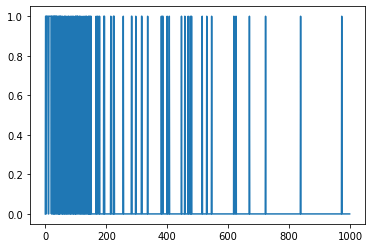

In [ ]:
plt.plot(train_data[0])

In [ ]:
# 베이스라인 deep learning 모델 (16) 
# 비교 : 작은 사이즈 4, 큰 사이즈 512

baseline_model = keras.Sequential([
    # `.summary` 메서드 때문에 `input_shape`가 필요합니다
    keras.layers.Dense(16, activation='relu', input_shape=(NUM_WORDS,)),
    keras.layers.Dense(16, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

baseline_model.compile(optimizer='adam',
                       loss='binary_crossentropy',
                       metrics=['accuracy', 'binary_crossentropy'])

baseline_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                16016     
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 16,305
Trainable params: 16,305
Non-trainable params: 0
_________________________________________________________________


In [ ]:
baseline_history = baseline_model.fit(train_data,
                                      train_labels,
                                      epochs=20,
                                      batch_size=512,
                                      validation_data=(test_data, test_labels),
                                      verbose=2)

Epoch 1/20
49/49 - 3s - loss: 0.5727 - accuracy: 0.7143 - binary_crossentropy: 0.5727 - val_loss: 0.4423 - val_accuracy: 0.8143 - val_binary_crossentropy: 0.4423 - 3s/epoch - 64ms/step
Epoch 2/20
49/49 - 0s - loss: 0.3792 - accuracy: 0.8418 - binary_crossentropy: 0.3792 - val_loss: 0.3524 - val_accuracy: 0.8518 - val_binary_crossentropy: 0.3524 - 323ms/epoch - 7ms/step
Epoch 3/20
49/49 - 0s - loss: 0.3263 - accuracy: 0.8653 - binary_crossentropy: 0.3263 - val_loss: 0.3347 - val_accuracy: 0.8591 - val_binary_crossentropy: 0.3347 - 328ms/epoch - 7ms/step
Epoch 4/20
49/49 - 0s - loss: 0.3090 - accuracy: 0.8735 - binary_crossentropy: 0.3090 - val_loss: 0.3286 - val_accuracy: 0.8601 - val_binary_crossentropy: 0.3286 - 313ms/epoch - 6ms/step
Epoch 5/20
49/49 - 0s - loss: 0.3025 - accuracy: 0.8760 - binary_crossentropy: 0.3025 - val_loss: 0.3298 - val_accuracy: 0.8592 - val_binary_crossentropy: 0.3298 - 326ms/epoch - 7ms/step
Epoch 6/20
49/49 - 0s - loss: 0.2965 - accuracy: 0.8772 - binary_cr

In [ ]:
# 작은 사이즈 deep learning 모델 (4)

smaller_model = keras.Sequential([
    keras.layers.Dense(4, activation='relu', input_shape=(NUM_WORDS,)),
    keras.layers.Dense(4, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

smaller_model.compile(optimizer='adam',
                      loss='binary_crossentropy',
                      metrics=['accuracy', 'binary_crossentropy'])

smaller_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 4)                 4004      
                                                                 
 dense_4 (Dense)             (None, 4)                 20        
                                                                 
 dense_5 (Dense)             (None, 1)                 5         
                                                                 
Total params: 4,029
Trainable params: 4,029
Non-trainable params: 0
_________________________________________________________________


In [ ]:
smaller_history = smaller_model.fit(train_data,
                                    train_labels,
                                    epochs=20,
                                    batch_size=512,
                                    validation_data=(test_data, test_labels),
                                    verbose=2)

Epoch 1/20
49/49 - 1s - loss: 0.6664 - accuracy: 0.5661 - binary_crossentropy: 0.6664 - val_loss: 0.6155 - val_accuracy: 0.6448 - val_binary_crossentropy: 0.6155 - 1s/epoch - 21ms/step
Epoch 2/20
49/49 - 0s - loss: 0.5695 - accuracy: 0.7254 - binary_crossentropy: 0.5695 - val_loss: 0.5391 - val_accuracy: 0.7593 - val_binary_crossentropy: 0.5391 - 319ms/epoch - 7ms/step
Epoch 3/20
49/49 - 0s - loss: 0.5099 - accuracy: 0.8127 - binary_crossentropy: 0.5099 - val_loss: 0.4975 - val_accuracy: 0.8182 - val_binary_crossentropy: 0.4975 - 314ms/epoch - 6ms/step
Epoch 4/20
49/49 - 0s - loss: 0.4736 - accuracy: 0.8452 - binary_crossentropy: 0.4736 - val_loss: 0.4694 - val_accuracy: 0.8444 - val_binary_crossentropy: 0.4694 - 310ms/epoch - 6ms/step
Epoch 5/20
49/49 - 0s - loss: 0.4460 - accuracy: 0.8632 - binary_crossentropy: 0.4460 - val_loss: 0.4480 - val_accuracy: 0.8520 - val_binary_crossentropy: 0.4480 - 318ms/epoch - 6ms/step
Epoch 6/20
49/49 - 0s - loss: 0.4226 - accuracy: 0.8714 - binary_cr

In [ ]:
# 큰 사이즈 deep learning 모델 (512)

bigger_model = keras.models.Sequential([
    keras.layers.Dense(512, activation='relu', input_shape=(NUM_WORDS,)),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

bigger_model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy','binary_crossentropy'])

bigger_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 512)               512512    
                                                                 
 dense_7 (Dense)             (None, 512)               262656    
                                                                 
 dense_8 (Dense)             (None, 1)                 513       
                                                                 
Total params: 775,681
Trainable params: 775,681
Non-trainable params: 0
_________________________________________________________________


In [ ]:
bigger_history = bigger_model.fit(train_data, train_labels,
                                  epochs=20,
                                  batch_size=512,
                                  validation_data=(test_data, test_labels),
                                  verbose=2)

Epoch 1/20
49/49 - 1s - loss: 0.4436 - accuracy: 0.7825 - binary_crossentropy: 0.4436 - val_loss: 0.3308 - val_accuracy: 0.8590 - val_binary_crossentropy: 0.3308 - 1s/epoch - 21ms/step
Epoch 2/20
49/49 - 0s - loss: 0.2904 - accuracy: 0.8787 - binary_crossentropy: 0.2904 - val_loss: 0.3220 - val_accuracy: 0.8580 - val_binary_crossentropy: 0.3220 - 347ms/epoch - 7ms/step
Epoch 3/20
49/49 - 0s - loss: 0.2262 - accuracy: 0.9105 - binary_crossentropy: 0.2262 - val_loss: 0.3431 - val_accuracy: 0.8563 - val_binary_crossentropy: 0.3431 - 344ms/epoch - 7ms/step
Epoch 4/20
49/49 - 0s - loss: 0.1086 - accuracy: 0.9668 - binary_crossentropy: 0.1086 - val_loss: 0.4103 - val_accuracy: 0.8493 - val_binary_crossentropy: 0.4103 - 339ms/epoch - 7ms/step
Epoch 5/20
49/49 - 0s - loss: 0.0238 - accuracy: 0.9958 - binary_crossentropy: 0.0238 - val_loss: 0.5401 - val_accuracy: 0.8494 - val_binary_crossentropy: 0.5401 - 348ms/epoch - 7ms/step
Epoch 6/20
49/49 - 0s - loss: 0.0043 - accuracy: 0.9999 - binary_cr

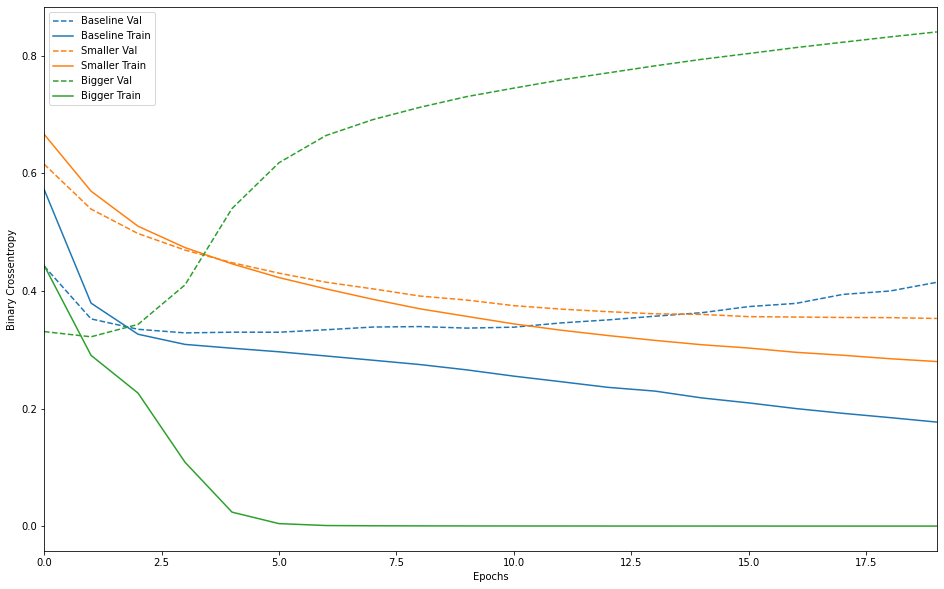

In [ ]:
# 모델 사이즈에 따른 성능 차이
# 작은 사이즈 small size : 4
# 베이스 라인 base line : 16
# 큰 사이즈 bigger size : 512
# 큰 사이즈에서 overfitting 현상이 발생하는 것을 확인할 수 있다. (초록색 점선 그래프)
# 작은 사이즈와 base line은 점선과 실선이 수렴하는 것을 확인 할 수 있다. (파란색, 주황색)

def plot_history(histories, key='binary_crossentropy'):
  plt.figure(figsize=(16,10))

  for name, history in histories:
    val = plt.plot(history.epoch, history.history['val_'+key],
                   '--', label=name.title()+' Val')
    plt.plot(history.epoch, history.history[key], color=val[0].get_color(),
             label=name.title()+' Train')

  plt.xlabel('Epochs')
  plt.ylabel(key.replace('_',' ').title())
  plt.legend()

  plt.xlim([0,max(history.epoch)])


plot_history([('baseline', baseline_history),
              ('smaller', smaller_history),
              ('bigger', bigger_history)])

In [ ]:
# Regularization이 적용된 deep learning 모델
# L2 norm 적용

l2_model = keras.models.Sequential([
    keras.layers.Dense(16, kernel_regularizer=keras.regularizers.l2(0.001),
                       activation='relu', input_shape=(NUM_WORDS,)),
    keras.layers.Dense(16, kernel_regularizer=keras.regularizers.l2(0.001),
                       activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

l2_model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy', 'binary_crossentropy'])

l2_model_history = l2_model.fit(train_data, train_labels,
                                epochs=20,
                                batch_size=512,
                                validation_data=(test_data, test_labels),
                                verbose=2)

Epoch 1/20
49/49 - 1s - loss: 0.7022 - accuracy: 0.5830 - binary_crossentropy: 0.6600 - val_loss: 0.6303 - val_accuracy: 0.7079 - val_binary_crossentropy: 0.5934 - 1s/epoch - 22ms/step
Epoch 2/20
49/49 - 0s - loss: 0.5408 - accuracy: 0.8056 - binary_crossentropy: 0.5049 - val_loss: 0.4622 - val_accuracy: 0.8419 - val_binary_crossentropy: 0.4262 - 331ms/epoch - 7ms/step
Epoch 3/20
49/49 - 0s - loss: 0.4042 - accuracy: 0.8596 - binary_crossentropy: 0.3673 - val_loss: 0.3893 - val_accuracy: 0.8562 - val_binary_crossentropy: 0.3517 - 315ms/epoch - 6ms/step
Epoch 4/20
49/49 - 0s - loss: 0.3612 - accuracy: 0.8708 - binary_crossentropy: 0.3237 - val_loss: 0.3702 - val_accuracy: 0.8608 - val_binary_crossentropy: 0.3332 - 350ms/epoch - 7ms/step
Epoch 5/20
49/49 - 0s - loss: 0.3468 - accuracy: 0.8725 - binary_crossentropy: 0.3104 - val_loss: 0.3714 - val_accuracy: 0.8580 - val_binary_crossentropy: 0.3360 - 338ms/epoch - 7ms/step
Epoch 6/20
49/49 - 1s - loss: 0.3427 - accuracy: 0.8738 - binary_cr

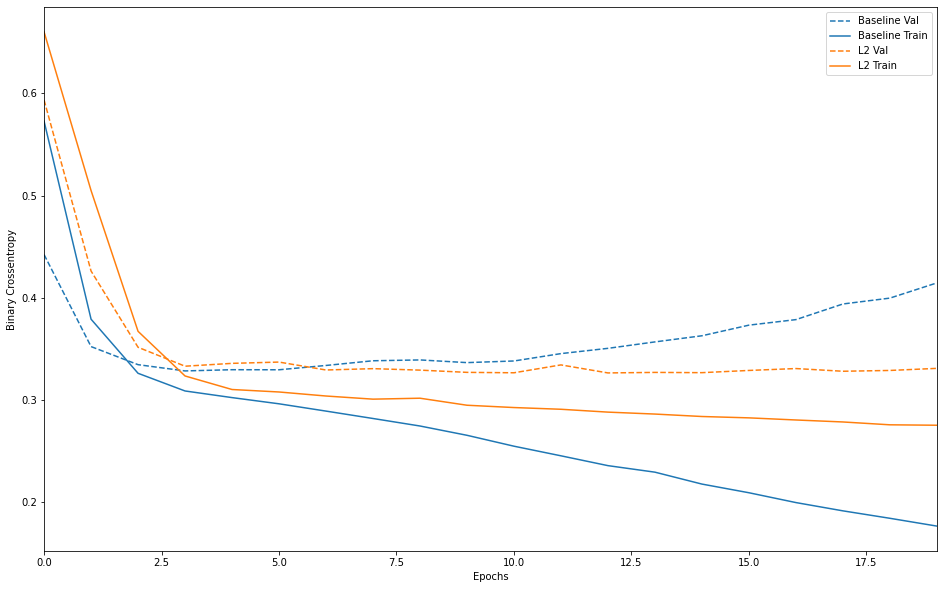

In [ ]:
# Regularization 이 적용된 모델의 오차가 더 작게 수렴하는 것을 확인 할 수 있다. (주황색)
# 점선과 실선의 거리 차이 = 오차 (cross entrophy)

plot_history([('baseline', baseline_history),
              ('l2', l2_model_history)])

In [ ]:
# Regularization이 적용된 deep learning 모델
# L2 norm 적용
# 큰 사이즈 deep learning 모델 (512)

l2_model = keras.models.Sequential([
    keras.layers.Dense(512, kernel_regularizer=keras.regularizers.l2(0.01),
                       activation='relu', input_shape=(NUM_WORDS,)),
    keras.layers.Dense(512, kernel_regularizer=keras.regularizers.l2(0.01),
                       activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

l2_model.compile(optimizer='adam',
                 loss='binary_crossentropy',
                 metrics=['accuracy', 'binary_crossentropy'])

l2_model_history = l2_model.fit(train_data, train_labels,
                                epochs=20,
                                batch_size=512,
                                validation_data=(test_data, test_labels),
                                verbose=2)

Epoch 1/20
49/49 - 1s - loss: 5.2743 - accuracy: 0.7837 - binary_crossentropy: 0.4675 - val_loss: 1.4136 - val_accuracy: 0.8491 - val_binary_crossentropy: 0.3550 - 1s/epoch - 26ms/step
Epoch 2/20
49/49 - 0s - loss: 0.7971 - accuracy: 0.8531 - binary_crossentropy: 0.3510 - val_loss: 0.5238 - val_accuracy: 0.8534 - val_binary_crossentropy: 0.3471 - 353ms/epoch - 7ms/step
Epoch 3/20
49/49 - 0s - loss: 0.4747 - accuracy: 0.8581 - binary_crossentropy: 0.3430 - val_loss: 0.4477 - val_accuracy: 0.8561 - val_binary_crossentropy: 0.3445 - 350ms/epoch - 7ms/step
Epoch 4/20
49/49 - 0s - loss: 0.4296 - accuracy: 0.8590 - binary_crossentropy: 0.3369 - val_loss: 0.4226 - val_accuracy: 0.8582 - val_binary_crossentropy: 0.3390 - 345ms/epoch - 7ms/step
Epoch 5/20
49/49 - 0s - loss: 0.4134 - accuracy: 0.8591 - binary_crossentropy: 0.3342 - val_loss: 0.4104 - val_accuracy: 0.8580 - val_binary_crossentropy: 0.3386 - 345ms/epoch - 7ms/step
Epoch 6/20
49/49 - 0s - loss: 0.4061 - accuracy: 0.8602 - binary_cr

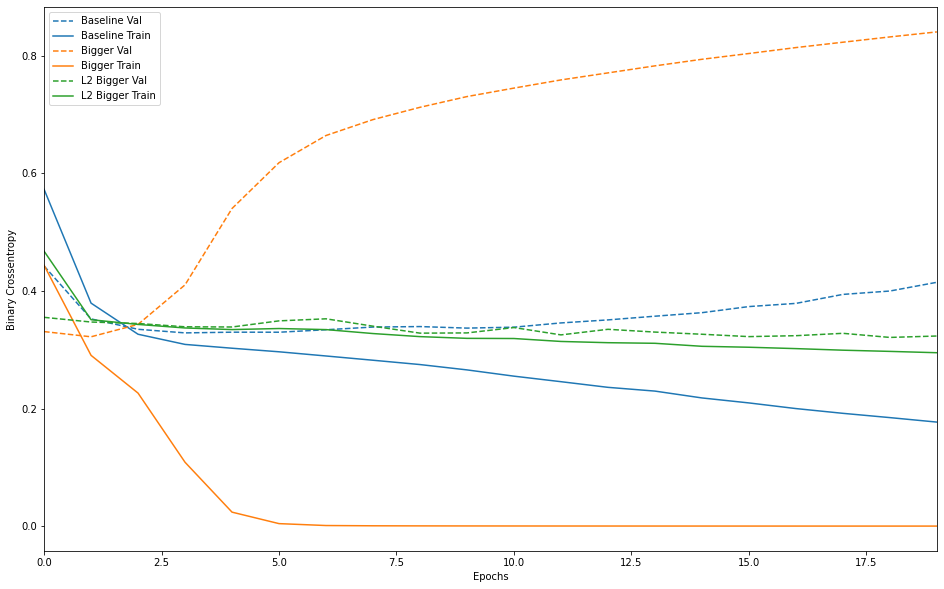

In [ ]:
plot_history([('baseline', baseline_history),
              ('bigger', bigger_history),
              ('l2 bigger', l2_model_history)])

### batch normalization

In [ ]:
# 배치 정규화 적용 하지 않은 모델
# Model A: Dense + ReLU
model_a = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax'),
])
model_a.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_18 (Dense)            (None, 64)                50240     
                                                                 
 dense_19 (Dense)            (None, 32)                2080      
                                                                 
 dense_20 (Dense)            (None, 10)                330       
                                                                 
Total params: 52,650
Trainable params: 52,650
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 배치 정규화 적용한 모델 
# 배치 정규화 : 공변량 쉬프트 현상을 줄이기 위해 정규화를 모든 층에 적용하는 기법
# Model B: Dense + BatchNorm + ReLU

model_b = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(64),

    # 배치정규화 적용
    tf.keras.layers.BatchNormalization(),

    # 배치정규화 후 활성화 함수 적용
    tf.keras.layers.Activation('relu'),

    tf.keras.layers.Dense(32),

    # 배치정규화 적용
    tf.keras.layers.BatchNormalization(),

    # 배치정규화 후 활성화 함수 적용
    tf.keras.layers.Activation('relu'),

    tf.keras.layers.Dense(10, activation='softmax'),
])
model_b.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_21 (Dense)            (None, 64)                50240     
                                                                 
 batch_normalization_2 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 activation (Activation)     (None, 64)                0         
                                                                 
 dense_22 (Dense)            (None, 32)                2080      
                                                                 
 batch_normalization_3 (Batc  (None, 32)               128       
 hNormalization)                                      

### Activation Functions

In [ ]:
# 다양한 활성함수

tf.keras.layers.Softmax()
tf.keras.layers.ReLU()
tf.keras.layers.LeakyReLU()
tf.keras.layers.PReLU()

In [ ]:
# LeakyReLU 기본 설정
tf.keras.layers.LeakyReLU()

# LeakyReLU, alpha=0.2 로 변경
tf.keras.layers.LeakyReLU(alpha=0.2)

In [ ]:
# 배치 정규화 적용 + LeakyReLU 활성함수 적용 모델 
# Model C: Dense + BatchNorm + LeakyReLU(0.2)

model_c = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(64),
    # 배치정규화 적용
    tf.keras.layers.BatchNormalization(),
    # LeakyReLU, alpha=0.2 적용
    tf.keras.layers.LeakyReLU(alpha=0.2),

    tf.keras.layers.Dense(32),
    # 배치정규화 적용
    tf.keras.layers.BatchNormalization(),
    # LeakyReLU, alpha=0.2 적용
    tf.keras.layers.LeakyReLU(alpha=0.2),

    tf.keras.layers.Dense(10, activation='softmax'),
])

# 모델 요약
model_c.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense_15 (Dense)            (None, 64)                50240     
                                                                 
 batch_normalization (BatchN  (None, 64)               256       
 ormalization)                                                   
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 64)                0         
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 batch_normalization_1 (Batc  (None, 32)               128       
 hNormalization)                                      

#### 비교

In [ ]:
# 모델 성능 비교
# Model A: Dense + ReLU
# Model B: Dense + BatchNorm + ReLU
# Model C: Dense + BatchNorm + LeakyReLU(0.2)

model_a.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_b.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_c.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# 모델 성능 비교

# Model A: Dense + ReLU
history_a = model_a.fit(x_train, y_train, 
                        validation_data=(x_test, y_test), 
                        epochs=10)

# Model B: Dense + BatchNorm + ReLU
history_b = model_b.fit(x_train, y_train, 
                        validation_data=(x_test, y_test), 
                        epochs=10)

# Model C: Dense + BatchNorm + LeakyReLU(0.2)
history_c = model_c.fit(x_train, y_train, 
                        validation_data=(x_test, y_test), 
                        epochs=10)

Epoch 1/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3060 - accuracy: 0.9129 - val_loss: 0.1601 - val_accuracy: 0.9541
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1355 - accuracy: 0.9597 - val_loss: 0.1190 - val_accuracy: 0.9649
Epoch 3/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0992 - accuracy: 0.9690 - val_loss: 0.1158 - val_accuracy: 0.9653
Epoch 4/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0782 - accuracy: 0.9762 - val_loss: 0.0983 - val_accuracy: 0.9692
Epoch 5/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0653 - accuracy: 0.9791 - val_loss: 0.0841 - val_accuracy: 0.9742
Epoch 6/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0541 - accuracy: 0.9826 - val_loss: 0.0968 - val_accuracy: 0.9705
Epoch 7/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0463 - accuracy: 0.9843 - val_loss: 0.0956 - val_accuracy:

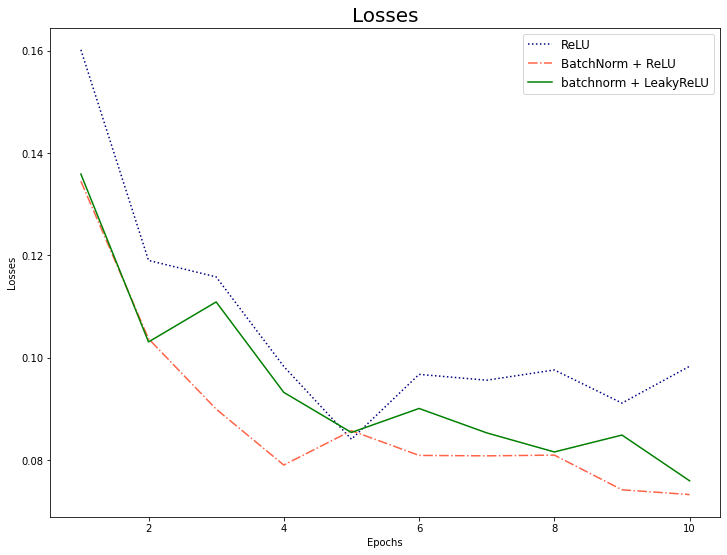

In [ ]:
# 모델 성능 비교 시각화
# Model A: Dense + ReLU
# Model B: Dense + BatchNorm + ReLU
# Model C: Dense + BatchNorm + LeakyReLU(0.2)

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 9))
plt.plot(np.arange(1, 11), history_a.history['val_loss'], color='navy', linestyle=':')
plt.plot(np.arange(1, 11), history_b.history['val_loss'], color='tomato', linestyle='-.')
plt.plot(np.arange(1, 11), history_c.history['val_loss'], color='green', linestyle='-')

plt.title('Losses', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.legend(['ReLU', 'BatchNorm + ReLU','batchnorm + LeakyReLU'], fontsize=12)
plt.show()

### Early Stopping

In [ ]:

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드 10개로 생성
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# 조기 종료, 조기 멈춤 : 검증 집합의 오류가 최저인 점에서 학습을 멈춤
# 모델의 구조를 변경하기 않아도 적용할 수 있는 방법

# EarlyStopping 콜백 생성
earlystopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [ ]:
hist = model.fit(x_train, y_train, 
          validation_data=(x_test, y_test), 
          epochs=50, 
          callbacks=[earlystopping]
          )

Epoch 1/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2333 - accuracy: 0.9307 - val_loss: 0.1459 - val_accuracy: 0.9527
Epoch 2/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0937 - accuracy: 0.9713 - val_loss: 0.0889 - val_accuracy: 0.9721
Epoch 3/50
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0640 - accuracy: 0.9800 - val_loss: 0.0766 - val_accuracy: 0.9749
Epoch 4/50
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0481 - accuracy: 0.9846 - val_loss: 0.1025 - val_accuracy: 0.9703
Epoch 5/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0385 - accuracy: 0.9876 - val_loss: 0.0731 - val_accuracy: 0.9805
Epoch 6/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0332 - accuracy: 0.9892 - val_loss: 0.0865 - val_accuracy: 0.9746
Epoch 7/50
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0283 - accuracy: 0.9909 - val_loss: 0.0832 - val_accuracy:

In [ ]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드 10개로 생성
])

model2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
hist2 = model2.fit(x_train, y_train, 
          validation_data=(x_test, y_test), 
          epochs=50
          )

Epoch 1/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2368 - accuracy: 0.9296 - val_loss: 0.1034 - val_accuracy: 0.9667
Epoch 2/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0940 - accuracy: 0.9711 - val_loss: 0.1080 - val_accuracy: 0.9673
Epoch 3/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0652 - accuracy: 0.9799 - val_loss: 0.0987 - val_accuracy: 0.9693
Epoch 4/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0503 - accuracy: 0.9838 - val_loss: 0.0763 - val_accuracy: 0.9764
Epoch 5/50
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0389 - accuracy: 0.9878 - val_loss: 0.0903 - val_accuracy: 0.9746
Epoch 6/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0326 - accuracy: 0.9895 - val_loss: 0.0789 - val_accuracy: 0.9771
Epoch 7/50
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0280 - accuracy: 0.9908 - val_loss: 0.0911 - val_accuracy:

#### 비교

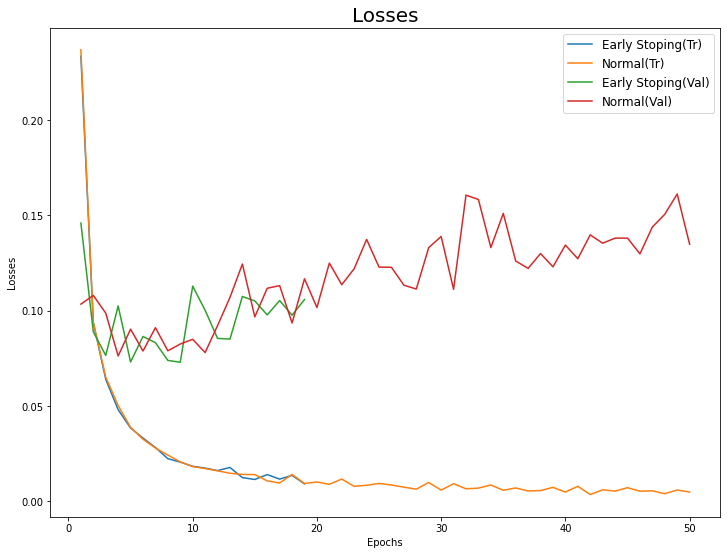

In [ ]:
# 조기 종료 사용에 따른 모델 성능 비교
# 조기 종료를 사용한 경우 Epoch 중간에 멈추는 것을 확인 할 수 있다. (파랑색, 초록색 그래프프)

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 9))
plt.plot(np.arange(1, len(hist.history['accuracy'])+1), hist.history['loss'])
plt.plot(np.arange(1, len(hist2.history['accuracy'])+1), hist2.history['loss'])
plt.plot(np.arange(1, len(hist.history['accuracy'])+1), hist.history['val_loss'])
plt.plot(np.arange(1, len(hist2.history['accuracy'])+1), hist2.history['val_loss'])

plt.title('Losses', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.legend(['Early Stoping(Tr)', 'Normal(Tr)', 'Early Stoping(Val)', 'Normal(Val)'], fontsize=12)
plt.show()

#### Optimizer

In [ ]:
import tensorflow as tf

In [ ]:
# Optimizer : Adaptive Learning rate를 적용한 다양한 학습 방법을 구현한 객체 

tf.keras.optimizers.SGD()
tf.keras.optimizers.Adagrad()
tf.keras.optimizers.RMSprop()
tf.keras.optimizers.Adam()

In [ ]:
model.compile(tf.keras.optimizers.SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

### Learning Rate Scheduler

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드 10개로 생성
])

In [ ]:
# Learning Rate Scheduler
# Custom adatptive learning rate를 정의한 모델

def scheduler(epoch, lr):
    tf.print(f'learning_rate: {lr:.5f}')
    # 첫 5 에포크 동안 유지
    if epoch < 5:
        return lr
    else:
    # 학습률 감소 적용
        return lr * tf.math.exp(-0.1)

# 콜백 객체생성 및 scheduler 함수 적용
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [ ]:
model.compile(tf.keras.optimizers.SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# 초기 학습률 확인(0.01)
print(round(model.optimizer.lr.numpy(), 5))

0.01


In [ ]:
# 결과창에서 learning_rate가 변하는 것을 확인 할 수 있다.

model.fit(x_train, y_train, 
          validation_data=(x_test, y_test), 
          epochs=10,
          # 학습률 스케줄러 적용
          callbacks=[lr_scheduler]
          )
# 최종 학습률 스케줄러 확인
round(model.optimizer.lr.numpy(), 5)

learning_rate: 0.01000
Epoch 1/10
1875/1875 [==============================] - 9s 4ms/step - loss: 0.6354 - accuracy: 0.8212 - val_loss: 0.2893 - val_accuracy: 0.9168 - lr: 0.0100
learning_rate: 0.01000
Epoch 2/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2619 - accuracy: 0.9238 - val_loss: 0.2160 - val_accuracy: 0.9361 - lr: 0.0100
learning_rate: 0.01000
Epoch 3/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2030 - accuracy: 0.9411 - val_loss: 0.1756 - val_accuracy: 0.9477 - lr: 0.0100
learning_rate: 0.01000
Epoch 4/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.1662 - accuracy: 0.9518 - val_loss: 0.1506 - val_accuracy: 0.9565 - lr: 0.0100
learning_rate: 0.01000
Epoch 5/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.1398 - accuracy: 0.9590 - val_loss: 0.1372 - val_accuracy: 0.9592 - lr: 0.0100
learning_rate: 0.01000
Epoch 6/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0

0.00607

In [ ]:
tf.keras.callbacks.ReduceLROnPlateau()

### Model Checkpoint

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드 10개로 생성
])

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# 모델 체크포인트 설정 : 학습 중간에 특정 기준에 따라 모델 전체 또는 모델의 weight를 저장해서 관리 가능하다.
# callbacks 함수 중 ModelCheckPoint 함수 클래스를 통해 학습 과정의 모델을 저장할 수 있다.

checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='tmp_checkpoint.ckpt', 
                                                save_weights_only=True, 
                                                save_best_only=True, 
                                                monitor='val_loss', 
                                                verbose=1)

In [ ]:
# ModelCheckpoint 사용 결과.

model.fit(x_train, y_train, 
          validation_data=(x_test, y_test), 
          epochs=10, 
          callbacks=[checkpoint]
          )

Epoch 1/10
1868/1875 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9325
Epoch 1: val_loss improved from inf to 0.11132, saving model to tmp_checkpoint.ckpt
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2262 - accuracy: 0.9326 - val_loss: 0.1113 - val_accuracy: 0.9633
Epoch 2/10
1867/1875 [============================>.] - ETA: 0s - loss: 0.0947 - accuracy: 0.9714
Epoch 2: val_loss improved from 0.11132 to 0.08570, saving model to tmp_checkpoint.ckpt
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0947 - accuracy: 0.9714 - val_loss: 0.0857 - val_accuracy: 0.9735
Epoch 3/10
1873/1875 [============================>.] - ETA: 0s - loss: 0.0669 - accuracy: 0.9800
Epoch 3: val_loss improved from 0.08570 to 0.07539, saving model to tmp_checkpoint.ckpt
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0671 - accuracy: 0.9799 - val_loss: 0.0754 - val_accuracy: 0.9770
Epoch 4/10
1869/1875 [======================

In [ ]:
!ls

checkpoint  sample_data				     tmp_checkpoint.ckpt.index
model.png   tmp_checkpoint.ckpt.data-00000-of-00001


In [ ]:
# 모델 체크포인트 로드 전
loss, acc = model.evaluate(x_test, y_test)
print(f'체크포인트 로드 전: loss: {loss:.4f}, acc: {acc:.4f}')


313/313 [==============================] - 1s 3ms/step - loss: 0.0830 - accuracy: 0.9795
체크포인트 로드 전: loss: 0.0830, acc: 0.9795


In [ ]:
# 체크포인트 파일을 모델에 로드
model.load_weights('tmp_checkpoint.ckpt')
loss, acc = model.evaluate(x_test, y_test)
print(f'체크포인트 로드 후: loss: {loss:.4f}, acc: {acc:.4f}')

313/313 [==============================] - 1s 3ms/step - loss: 0.0679 - accuracy: 0.9809
체크포인트 로드 후: loss: 0.0679, acc: 0.9809


### Model Save & Load

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드는 10개가 되어야 한다.
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_train, y_train,
            validation_data=(x_test, y_test), 
            epochs=10, 
            )

Epoch 1/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2239 - accuracy: 0.9331 - val_loss: 0.1498 - val_accuracy: 0.9523
Epoch 2/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0943 - accuracy: 0.9707 - val_loss: 0.1031 - val_accuracy: 0.9663
Epoch 3/10
1875/1875 [==============================] - 10s 6ms/step - loss: 0.0649 - accuracy: 0.9800 - val_loss: 0.0965 - val_accuracy: 0.9699
Epoch 4/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0504 - accuracy: 0.9842 - val_loss: 0.0942 - val_accuracy: 0.9723
Epoch 5/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0401 - accuracy: 0.9869 - val_loss: 0.0992 - val_accuracy: 0.9728
Epoch 6/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0323 - accuracy: 0.9891 - val_loss: 0.0761 - val_accuracy: 0.9793
Epoch 7/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0276 - accuracy: 0.9910 - val_loss: 0.1172 - val_accur

In [ ]:
model.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_10 (Flatten)        (None, 784)               0         
                                                                 
 dense_63 (Dense)            (None, 256)               200960    
                                                                 
 dense_64 (Dense)            (None, 64)                16448     
                                                                 
 dense_65 (Dense)            (None, 32)                2080      
                                                                 
 dense_66 (Dense)            (None, 10)                330       
                                                                 
Total params: 219,818
Trainable params: 219,818
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 모델 검증
loss, acc = model.evaluate(x_test, y_test, verbose=0)
print(f'h5 model] loss: {loss:.5f}, acc: {acc:.5f}')

h5 model] loss: 0.08015, acc: 0.98050


#### H5 format 저장

In [ ]:
# 모델 Save : 모델의 weight, 구조, hyperparameter, 등을 저장
# 저장 형식 : TensorFlow SavedModel 형식, Keras H5 형식 2가지 사용 가능 
# 모델을 H5 format 으로 저장
# H5 format : complie 정보가 포함된 단일 파일 생성   
model.save('h5-model.h5')

In [ ]:
!ls

checkpoint   model.png	  tmp_checkpoint.ckpt.data-00000-of-00001
h5-model.h5  sample_data  tmp_checkpoint.ckpt.index


In [ ]:
# 모델 Load
# 모델 복원 불러오기
h5_model = tf.keras.models.load_model('h5-model.h5')
h5_model.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_10 (Flatten)        (None, 784)               0         
                                                                 
 dense_63 (Dense)            (None, 256)               200960    
                                                                 
 dense_64 (Dense)            (None, 64)                16448     
                                                                 
 dense_65 (Dense)            (None, 32)                2080      
                                                                 
 dense_66 (Dense)            (None, 10)                330       
                                                                 
Total params: 219,818
Trainable params: 219,818
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 모델 검증
loss, acc = h5_model.evaluate(x_test, y_test, verbose=0)
print(f'h5 model] loss: {loss:.5f}, acc: {acc:.5f}')

h5 model] loss: 0.08015, acc: 0.98050


#### SavedMdoel format 저장

In [ ]:
# 모델 Save : 모델의 weight, 구조, hyperparameter, 등을 저장
# 저장 형식 : TensorFlow SavedModel 형식, Keras H5 형식 2가지 사용 가능 
# 모델을 SavedModel format 으로 저장
# 모델 아키텍처 및 훈련 구성(optimizer, loss, metric)은 saved_model.pb 파일에 저장됨.
# 가중치는 variables 디렉토리에 저장됨 
model.save('saved-model')

INFO:tensorflow:Assets written to: saved-model/assets


In [ ]:
!ls

checkpoint   sample_data			      tmp_checkpoint.ckpt.index
h5-model.h5  saved-model
model.png    tmp_checkpoint.ckpt.data-00000-of-00001


In [ ]:
!ls ./saved-model

assets	keras_metadata.pb  saved_model.pb  variables


In [ ]:
# 모델 Load
# 모델 복원 불러오기
saved_model = tf.keras.models.load_model('saved-model')
saved_model.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_10 (Flatten)        (None, 784)               0         
                                                                 
 dense_63 (Dense)            (None, 256)               200960    
                                                                 
 dense_64 (Dense)            (None, 64)                16448     
                                                                 
 dense_65 (Dense)            (None, 32)                2080      
                                                                 
 dense_66 (Dense)            (None, 10)                330       
                                                                 
Total params: 219,818
Trainable params: 219,818
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 모델 검증 (HDF5 포맷)
loss, acc = h5_model.evaluate(x_test, y_test, verbose=0)
print(f'[h5 model] loss: {loss:.5f}, acc: {acc:.5f}')

# 모델 검증 (SavedModel 포맷)
loss, acc = saved_model.evaluate(x_test, y_test, verbose=0)
print(f'[saved_model] loss: {loss:.5f}, acc: {acc:.5f}')

[h5 model] loss: 0.08015, acc: 0.98050
[saved_model] loss: 0.08015, acc: 0.98050


# 딥러닝 강의 11주차

## mnist classification with Neural Networks

In [ ]:
import tensorflow as tf

# 케라스의 내장 데이터셋에서 mnist 데이터셋을 로드
mnist = tf.keras.datasets.mnist

# load_data()로 데이터셋을 로드 합니다.
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# 로드된 데이터셋 확인
print('train set: ', x_train.shape, y_train.shape)
print('test  set: ', x_test.shape, y_test.shape)

# 데이터 정규화
x_train = x_train / x_train.max() # max: 255
x_test = x_test / x_test.max() # max: 255

11501568/11490434 [==============================] - 0s 0us/step
train set:  (60000, 28, 28) (60000,)
test  set:  (10000, 28, 28) (10000,)


## Tensorflow Advanced Techniques

### Tensorboard

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(32, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), # 노드 10개로 생성
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Tensorboard : 모델의 학습과정과 결과, weight 분포등을 확인 할 수 있는 web 기반 모니터링 도구
# callback 함수로 생성
# 매직 커멘드로 로드

# 텐서보드 저장 경로 지정
log_dir = 'tensorboard'

# Tensorboard callback 함수로 생성
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x_train, y_train,
            validation_data=(x_test, y_test), 
            epochs=10, 
            callbacks=[tensorboard],
            )

Epoch 1/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2269 - accuracy: 0.9317 - val_loss: 0.1173 - val_accuracy: 0.9650
Epoch 2/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0938 - accuracy: 0.9714 - val_loss: 0.0863 - val_accuracy: 0.9722
Epoch 3/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0648 - accuracy: 0.9794 - val_loss: 0.0787 - val_accuracy: 0.9768
Epoch 4/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0484 - accuracy: 0.9847 - val_loss: 0.0816 - val_accuracy: 0.9788
Epoch 5/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0413 - accuracy: 0.9864 - val_loss: 0.0768 - val_accuracy: 0.9775
Epoch 6/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0336 - accuracy: 0.9889 - val_loss: 0.0741 - val_accuracy: 0.9801
Epoch 7/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0262 - accuracy: 0.9915 - val_loss: 0.1030 - val_accuracy:

In [ ]:
# Tensorboard extension 로드
%load_ext tensorboard

In [ ]:
# Tensorboard 매직 커멘드로 로드
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

### Functional API

In [ ]:
# deep learning 모델을 설계하는 방법
# 1. sequential 형식
# 2. Functional 형식 


# deep learning 모델을 설계하는 방법
# 1. sequential 형식
seq_model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)), 
    tf.keras.layers.Dense(256, activation='relu'), 
    tf.keras.layers.Dense(64, activation='relu'), 
    tf.keras.layers.Dense(10, activation='softmax'), 
])

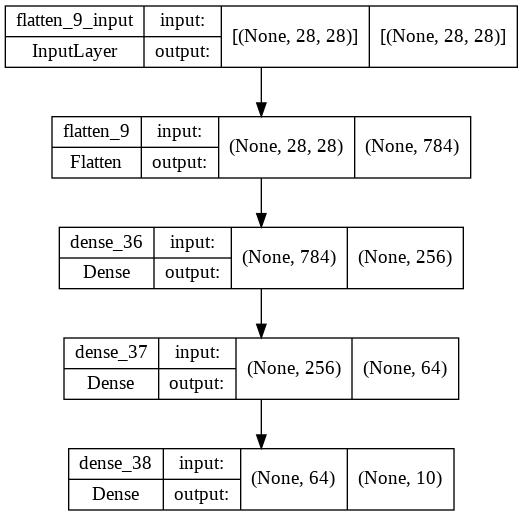

In [ ]:
from tensorflow.keras.utils import plot_model

# 구조도 시각화
plot_model(seq_model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:
# deep learning 모델을 설계하는 방법
# 2. Functional 형식 

# 모델의 레이어를 체인 구조로 연결 Input 레이어 정의
input_layer = tf.keras.Input(shape=(28, 28), name='InputLayer')

# 모델의 레이어를 체인 구조로 연결
x1 = tf.keras.layers.Flatten(name='Flatten')(input_layer)
x2 = tf.keras.layers.Dense(256, activation='relu', name='Dense1')(x1)
x3 = tf.keras.layers.Dense(64, activation='relu', name='Dense2')(x2)
x4 = tf.keras.layers.Dense(10, activation='softmax', name='OutputLayer')(x3)

In [ ]:
# 모델 생성
func_model = tf.keras.Model(inputs=input_layer, outputs=x4, name='FunctionalModel')

# 모델 요약
func_model.summary()

Model: "FunctionalModel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 InputLayer (InputLayer)     [(None, 28, 28)]          0         
                                                                 
 Flatten (Flatten)           (None, 784)               0         
                                                                 
 Dense1 (Dense)              (None, 256)               200960    
                                                                 
 Dense2 (Dense)              (None, 64)                16448     
                                                                 
 OutputLayer (Dense)         (None, 10)                650       
                                                                 
Total params: 218,058
Trainable params: 218,058
Non-trainable params: 0
_________________________________________________________________


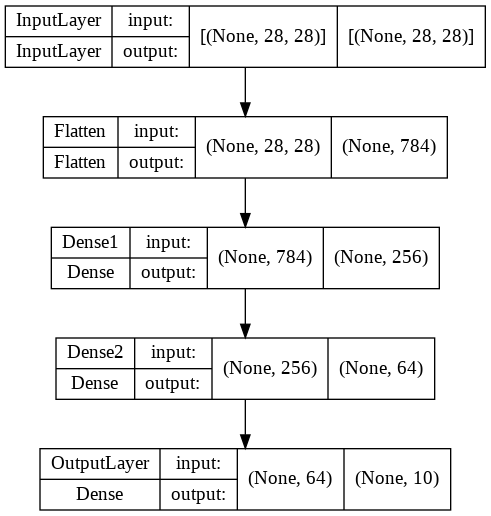

In [ ]:
from tensorflow.keras.utils import plot_model

# 구조도 시각화
plot_model(func_model, show_shapes=True, show_layer_names=True, to_file='model.png')

In [ ]:

# 컴파일
func_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 훈련
func_model.fit(x_train, y_train, epochs=3)

# 검증
loss, acc = func_model.evaluate(x_test, y_test, verbose=0)
print(f'Functional Model] loss: {loss:.5f}, acc: {acc:.5f}')

Epoch 1/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2086 - accuracy: 0.9377
Epoch 2/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0887 - accuracy: 0.9729
Epoch 3/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0605 - accuracy: 0.9807
Functional Model] loss: 0.07409, acc: 0.97680


### Model 정보 확인 방법

In [ ]:
# Layer 정보 확인 방법 

for layer in func_model.layers:
    print(layer.name, layer)

InputLayer <keras.engine.input_layer.InputLayer object at 0x7fa6dfeff850>
Flatten <keras.layers.core.flatten.Flatten object at 0x7fa6dfeff690>
Dense1 <keras.layers.core.dense.Dense object at 0x7fa6dfeff990>
Dense2 <keras.layers.core.dense.Dense object at 0x7fa6dfef9510>
OutputLayer <keras.layers.core.dense.Dense object at 0x7fa6dfee7b90>


In [ ]:
# layer의 weight 확인 방법 

print(func_model.layers[2].weights)
print(func_model.layers[2].bias.numpy())
print(func_model.layers[2].bias_initializer)

[<tf.Variable 'Dense1/kernel:0' shape=(784, 256) dtype=float32, numpy=
array([[ 0.02254315,  0.03521247,  0.06695367, ..., -0.03645059,
        -0.03454277,  0.00710498],
       [ 0.02244522,  0.02647278, -0.02200861, ...,  0.07127023,
         0.00119921,  0.05020826],
       [-0.04288635,  0.06581102,  0.04203934, ..., -0.00439265,
         0.04309124,  0.07544896],
       ...,
       [ 0.006274  , -0.06001895,  0.01108953, ..., -0.01976318,
         0.06470966, -0.01556635],
       [-0.01780103,  0.04560596,  0.0398762 , ...,  0.04387879,
         0.01774485,  0.04333886],
       [ 0.02010149,  0.05596033, -0.07312879, ...,  0.00889255,
         0.00993364,  0.02386115]], dtype=float32)>, <tf.Variable 'Dense1/bias:0' shape=(256,) dtype=float32, numpy=
array([-4.02091555e-02, -1.23936972e-02,  1.45170372e-02, -3.03803235e-02,
        2.68870909e-02,  2.91914586e-02, -2.82700192e-02, -4.86840419e-02,
        6.36318652e-03, -4.17699851e-02, -1.18978964e-02,  4.23999354e-02,
        2.

In [ ]:
# layer의 weight 확인 방법 

print((func_model.get_layer("Dense1").weights))

[<tf.Variable 'Dense1/kernel:0' shape=(784, 256) dtype=float32, numpy=
array([[ 0.02254315,  0.03521247,  0.06695367, ..., -0.03645059,
        -0.03454277,  0.00710498],
       [ 0.02244522,  0.02647278, -0.02200861, ...,  0.07127023,
         0.00119921,  0.05020826],
       [-0.04288635,  0.06581102,  0.04203934, ..., -0.00439265,
         0.04309124,  0.07544896],
       ...,
       [ 0.006274  , -0.06001895,  0.01108953, ..., -0.01976318,
         0.06470966, -0.01556635],
       [-0.01780103,  0.04560596,  0.0398762 , ...,  0.04387879,
         0.01774485,  0.04333886],
       [ 0.02010149,  0.05596033, -0.07312879, ...,  0.00889255,
         0.00993364,  0.02386115]], dtype=float32)>, <tf.Variable 'Dense1/bias:0' shape=(256,) dtype=float32, numpy=
array([-4.02091555e-02, -1.23936972e-02,  1.45170372e-02, -3.03803235e-02,
        2.68870909e-02,  2.91914586e-02, -2.82700192e-02, -4.86840419e-02,
        6.36318652e-03, -4.17699851e-02, -1.18978964e-02,  4.23999354e-02,
        2.

### Model Subclassing Coding Guide

#### Baseline

In [ ]:
class MyModel(tf.keras.Model):
    
    def __init__(self):
        super(MyModel, self).__init__()
        # 초기값 설정
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(256, activation='relu')
        self.dense2 = tf.keras.layers.Dense(64, activation='relu')
        self.dense3 = tf.keras.layers.Dense(10, activation='softmax')
        
    # class overiding
    # 학습용 함수 정의
    # x는 input
    def call(self, x):
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return x

In [ ]:
# 모델 생성
mymodel = MyModel()

# 모델의 이름 설정
mymodel._name = 'subclass_model'

# 모델 input 정의
mymodel(tf.keras.layers.Input(shape=(28, 28)))

# 모델 요약
mymodel.summary()

Model: "subclass_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         multiple                  0         
                                                                 
 dense_12 (Dense)            multiple                  200960    
                                                                 
 dense_13 (Dense)            multiple                  16448     
                                                                 
 dense_14 (Dense)            multiple                  650       
                                                                 
Total params: 218,058
Trainable params: 218,058
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 컴파일
mymodel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 훈련
mymodel.fit(x_train, y_train, epochs=3)

# 검증
loss, acc = mymodel.evaluate(x_test, y_test, verbose=0)
print(f'Subclassing Model] loss: {loss:.5f}, acc: {acc:.5f}')

Epoch 1/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2162 - accuracy: 0.9362
Epoch 2/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0880 - accuracy: 0.9727
Epoch 3/3
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0594 - accuracy: 0.9809
Subclassing Model] loss: 0.06988, acc: 0.97810


#### Hyperparameter 사용

In [ ]:
# Hyperparameter 사용 : 기존의 모델 상속 방법과 동일함
# __init__ 함수에 다양한 hyperparameter를 추가해서 사용 

class MyModel(tf.keras.Model):
    
    # 생성자 parameter 추가
    def __init__(self, units, num_classes):
        super(MyModel, self).__init__()
        # 초기값 설정
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(units, activation='relu')
        self.dense2 = tf.keras.layers.Dense(units/4, activation='relu')
        self.dense3 = tf.keras.layers.Dense(num_classes, activation='softmax')
        
    # class overiding
    # 학습용 함수 정의
    # x는 input
    def call(self, x):
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return x

In [ ]:
# 모델 생성
mymodel = MyModel(512, 10)

# 모델 input 정의
mymodel(tf.keras.layers.Input(shape=(28, 28)))

# 모델 요약
mymodel.summary()

Model: "my_model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_4 (Flatten)         multiple                  0         
                                                                 
 dense_15 (Dense)            multiple                  401920    
                                                                 
 dense_16 (Dense)            multiple                  65664     
                                                                 
 dense_17 (Dense)            multiple                  1290      
                                                                 
Total params: 468,874
Trainable params: 468,874
Non-trainable params: 0
_________________________________________________________________


In [ ]:

# 컴파일
mymodel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 훈련
mymodel.fit(x_train, y_train, epochs=3)

# 검증
loss, acc = mymodel.evaluate(x_test, y_test, verbose=0)
print(f'[Subclassing Model w. parameters] loss: {loss:.5f}, acc: {acc:.5f}')

Epoch 1/3
1875/1875 [==============================] - 11s 6ms/step - loss: 0.1896 - accuracy: 0.9431
Epoch 2/3
1875/1875 [==============================] - 10s 6ms/step - loss: 0.0796 - accuracy: 0.9751
Epoch 3/3
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0546 - accuracy: 0.9825
[Subclassing Model w. parameters] loss: 0.08927, acc: 0.97070


In [ ]:
# Hyperparameter 사용
# *args, **kwargs와 같은 가변인자를 사용하여 편리하게 모델의 클래스 정의가 가능함

class MyModel(tf.keras.Model):
    
    # 생성자 parameter 추가
    def __init__(self, **kwargs):
        super(MyModel, self).__init__()
        # 초기값 설정
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(kwargs['units'], activation='relu')
        self.dense2 = tf.keras.layers.Dense(kwargs['units']/4, activation='relu')
        self.dense3 = tf.keras.layers.Dense(kwargs['num_classes'], activation='softmax')
        
    # class overiding
    # 학습용 함수 정의
    # x는 input
    def call(self, x):
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return x

In [ ]:
# 모델 생성
mymodel = MyModel(units = 512, num_classes= 10)

# 모델 input 정의
mymodel(tf.keras.layers.Input(shape=(28, 28)))

# 모델 요약
mymodel.summary()

Model: "my_model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_11 (Flatten)        multiple                  0         
                                                                 
 dense_43 (Dense)            multiple                  401920    
                                                                 
 dense_44 (Dense)            multiple                  65664     
                                                                 
 dense_45 (Dense)            multiple                  1290      
                                                                 
Total params: 468,874
Trainable params: 468,874
Non-trainable params: 0
_________________________________________________________________


### Custom Loss

In [ ]:
import tensorflow as tf
import numpy as np

# 샘플 데이터 생성
X = np.array([0.0, 1.0, 2.0, 3.0, 4.0, 5.0], dtype=float)
Y = np.array([2.0, 4.0, 6.0, 8.0, 10.0, 12.0], dtype=float)


In [ ]:

model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1, input_shape=[1])
])


#### Baseline

In [ ]:
# Huber Loss

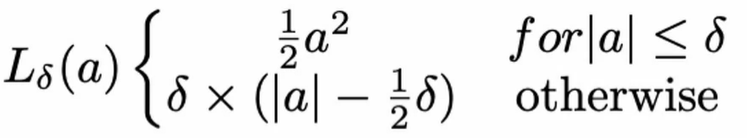

In [ ]:

# 사용자 정의 손실함수(Huber Loss 구현)
def my_huber_loss(y_true, y_pred):
    
    # 임계값 정의
    threshold = 1

    # 손실 계산
    error = y_true - y_pred

    is_small_error = tf.abs(error) <= threshold

    # l2 loss 적용
    small_error_loss = tf.square(error) / 2

    # l1 loss 적용
    big_error_loss = threshold * (tf.abs(error) - (0.5 * threshold))

    # return
    return tf.where(is_small_error, small_error_loss, big_error_loss)


In [ ]:

# 사용자 정의 custom_huber_loss 함수를 적용
model.compile(optimizer='sgd', loss=my_huber_loss)
model.fit(X, Y, epochs=1000,verbose=0)

In [ ]:

# 결과 확인
print(model.predict([6.0]))

[[14.048939]]


#### Hyperparameter 사용

In [ ]:
def my_huber_loss_with_threshold(threshold):
    def my_huber_loss(y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) <= threshold
        small_error_loss = tf.square(error) / 2
        big_error_loss = threshold * (tf.abs(error) - (0.5 * threshold))
        return tf.where(is_small_error, small_error_loss, big_error_loss)
    return my_huber_loss

In [ ]:

model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1, input_shape=[1])
])

# 사용자 정의 custom_huber_loss 함수를 적용
model.compile(optimizer='sgd', loss=my_huber_loss_with_threshold(1))
model.fit(X, Y, epochs=1000,verbose=0)


In [ ]:

# 결과 확인
print(model.predict([6.0]))

[[14.028131]]


In [ ]:
test1 = my_huber_loss_with_threshold(1)
test2 = my_huber_loss_with_threshold(2)

In [ ]:
test1(2.0, 6.0).numpy(), test2(2.0, 6.0).numpy()

(3.5, 6.0)

#### Loss Class 상속

In [ ]:
from tensorflow.keras.losses import Loss
 
class MyHuberLoss(Loss):
    def __init__(self, threshold = 1):
        super().__init__()
        self.threshold = threshold
    
    def call(self, y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) <= self.threshold
        small_error_loss = tf.square(error) / 2
        big_error_loss = self.threshold * (tf.abs(error) - (0.5 * self.threshold))
        return tf.where(is_small_error, small_error_loss, big_error_loss)

In [ ]:

model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1, input_shape=[1])
])

my_huber_loss_with_class = MyHuberLoss(1)

# 사용자 정의 custom_huber_loss 함수를 적용
model.compile(optimizer='sgd', loss=my_huber_loss_with_class)
model.fit(X, Y, epochs=1000,verbose=0)

# 결과 확인
print(model.predict([6.0]))

[[14.056347]]


### Custom Layer

In [ ]:
# Custom layer는 Tensorflow Layer class를 상속받아 작성
# __init__, build, call 함수가 필요함 
# __init__ : 초기화, hyperparameter 셋업 
# build : 실제 weight와 bias 정의 
# call : Layer가 수행해야 할 연산을 정의 

import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer

class MyDense(Layer):

# __init__ : 초기화, hyperparameter 셋업 
    def __init__(self, units=32, input_shape=None):
        super(MyDense, self).__init__(input_shape=input_shape)
        self.units = units

    def build(self, input_shape):
        # weight를 초기화 합니다.
        w_init = tf.random_normal_initializer()
        self.w = tf.Variable(name="weight", 
                             initial_value=w_init(shape=(input_shape[-1], self.units), dtype='float32'),
                             trainable=True)

        # bias를 초기화 합니다.
        b_init = tf.zeros_initializer()
        self.b = tf.Variable(name="bias", 
                             initial_value=b_init(shape=(self.units,), dtype='float32'),
                             trainable=True)

    def call(self, inputs):
        # wx + b
        return tf.matmul(inputs, self.w) + self.b

In [ ]:
# 샘플 데이터 생성
X = np.array([0.0, 1.0, 2.0, 3.0, 4.0, 5.0], dtype=float)
Y = np.array([2.0, 4.0, 6.0, 8.0, 10.0, 12.0], dtype=float)

# 사용자 정의 MyDense 레이어를 적용한 경우
model = tf.keras.Sequential([
    MyDense(units=1, input_shape=[1])
])
# 컴파일
model.compile(optimizer='sgd', loss='mse')
# 훈련
model.fit(X, Y, epochs=1000,verbose=0)

# 결과 확인
print(model.predict([6.0]))

[[14.002433]]


In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', 
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 26, 26, 32)        320       
                                                                 
 pool (MaxPooling2D)         (None, 13, 13, 32)        0         
                                                                 
 flatten (Flatten)           (None, 5408)              0         
                                                                 
 dense (Dense)               (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model2 = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same", 
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 28, 28, 64)        640       
                                                                 
 pool (MaxPooling2D)         (None, 14, 14, 64)        0         
                                                                 
 flatten_1 (Flatten)         (None, 12544)             0         
                                                                 
 dense_1 (Dense)             (None, 10)                125450    
                                                                 
Total params: 126,090
Trainable params: 126,090
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model3 = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same", strides = 2,
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 14, 14, 64)        640       
                                                                 
 pool (MaxPooling2D)         (None, 7, 7, 64)          0         
                                                                 
 flatten_2 (Flatten)         (None, 3136)              0         
                                                                 
 dense_2 (Dense)             (None, 10)                31370     
                                                                 
Total params: 32,010
Trainable params: 32,010
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 두 번째 레이어(pool) 출력층 
pooling_activation = activations[1]
print(pooling_activation.shape)

(1, 13, 13, 32)


# 딥러닝 13주차 강의

## Mnist Classification Using CNN

### Import

In [ ]:
# tensorflow 모듈 import 
import tensorflow as tf
# 샘플 이미지 출력
import matplotlib.pylab as plt

### Dataset Load

In [ ]:
# MNIST 손글씨 이미지 데이터 로드
mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_valid, y_valid) = mnist.load_data()

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

11501568/11490434 [==============================] - 0s 0us/step
(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


### Preprocessing

In [ ]:
# 정규화(Normalization)
x_train = x_train / 255.0
x_valid = x_valid / 255.0

print(x_train.min(), x_train.max())
print(x_valid.min(), x_valid.max())

NameError: ignored

In [ ]:
# 채널 추가
print(x_train.shape, x_valid.shape)

x_train_in = x_train[..., tf.newaxis]
x_valid_in = x_valid[..., tf.newaxis]

print(x_train_in.shape, x_valid_in.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


### Build Model

In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', 
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 26, 26, 32)        320       
                                                                 
 pool (MaxPooling2D)         (None, 13, 13, 32)        0         
                                                                 
 flatten (Flatten)           (None, 5408)              0         
                                                                 
 dense (Dense)               (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model2 = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same", 
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 28, 28, 64)        640       
                                                                 
 pool (MaxPooling2D)         (None, 14, 14, 64)        0         
                                                                 
 flatten_1 (Flatten)         (None, 12544)             0         
                                                                 
 dense_1 (Dense)             (None, 10)                125450    
                                                                 
Total params: 126,090
Trainable params: 126,090
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Sequential API를 사용하여 샘플 모델 생성
model3 = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding="same", strides = 2,
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

In [ ]:
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 14, 14, 64)        640       
                                                                 
 pool (MaxPooling2D)         (None, 7, 7, 64)          0         
                                                                 
 flatten_2 (Flatten)         (None, 3136)              0         
                                                                 
 dense_2 (Dense)             (None, 10)                31370     
                                                                 
Total params: 32,010
Trainable params: 32,010
Non-trainable params: 0
_________________________________________________________________


### Training

In [ ]:
# 모델 훈련
history = model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 16s 3ms/step - loss: 0.2049 - accuracy: 0.9416 - val_loss: 0.0854 - val_accuracy: 0.9748
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0785 - accuracy: 0.9773 - val_loss: 0.0716 - val_accuracy: 0.9767
Epoch 3/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0606 - accuracy: 0.9823 - val_loss: 0.0582 - val_accuracy: 0.9807
Epoch 4/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0503 - accuracy: 0.9851 - val_loss: 0.0607 - val_accuracy: 0.9812
Epoch 5/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0422 - accuracy: 0.9877 - val_loss: 0.0559 - val_accuracy: 0.9807
Epoch 6/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0364 - accuracy: 0.9886 - val_loss: 0.0522 - val_accuracy: 0.9841
Epoch 7/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0313 - accuracy: 0.9904 - val_loss: 0.0542 - val_accuracy

### Evaluation

In [ ]:
model.evaluate(x_valid_in, y_valid)

313/313 [==============================] - 1s 2ms/step - loss: 0.0563 - accuracy: 0.9841


[0.05632462725043297, 0.9840999841690063]

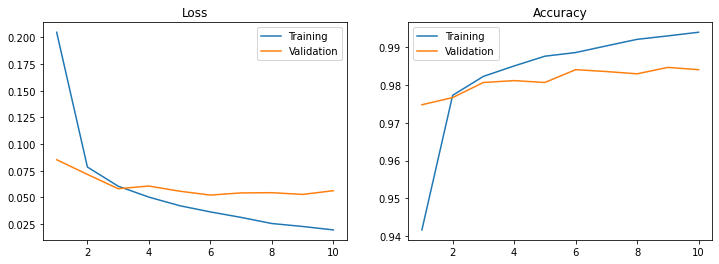

In [ ]:
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 10)

### Debug - Layer 시각화

In [ ]:
# 모델 구조 
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv (Conv2D)               (None, 26, 26, 32)        320       
                                                                 
 pool (MaxPooling2D)         (None, 13, 13, 32)        0         
                                                                 
 flatten (Flatten)           (None, 5408)              0         
                                                                 
 dense (Dense)               (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 입력 텐서 형태 
model.input

<KerasTensor: shape=(None, 28, 28, 1) dtype=float32 (created by layer 'conv_input')>

In [ ]:
# 출력 텐서 형태 
model.output

<KerasTensor: shape=(None, 10) dtype=float32 (created by layer 'dense')>

In [ ]:
# 레이어 
model.layers

In [ ]:
# 첫번째 레이어 선택
model.layers[0]

In [ ]:
# 첫번째 레이어 입력
model.layers[0].input

<KerasTensor: shape=(None, 28, 28, 1) dtype=float32 (created by layer 'conv_input')>

In [ ]:
# 첫번째 레이어 출력
model.layers[0].output

<KerasTensor: shape=(None, 26, 26, 32) dtype=float32 (created by layer 'conv')>

In [ ]:
model.layers[0].kernel[:,:,:,0]

<tf.Tensor: shape=(3, 3, 1), dtype=float32, numpy=
array([[[-0.6271702 ],
        [-0.6337193 ],
        [-0.50904346]],

       [[ 0.08443513],
        [ 0.14821665],
        [ 0.17565404]],

       [[ 0.44999036],
        [ 0.41083172],
        [ 0.30114576]]], dtype=float32)>

In [ ]:
# 첫번째 레이어 가중치
model.layers[0].weights

[<tf.Variable 'conv/kernel:0' shape=(3, 3, 1, 32) dtype=float32, numpy=
 array([[[[-0.40175235, -0.0142021 , -0.16541943,  0.07101345,
            0.13851653, -0.1466414 , -0.69844335, -0.6724889 ,
            0.18092819,  0.3085583 , -0.33449966,  0.30880442,
            0.03788541, -0.6169763 , -0.03348263, -0.91614956,
           -0.6573538 ,  0.615798  , -0.26420498,  0.30067775,
            0.626597  ,  0.05849747,  0.43824226, -0.6860424 ,
           -0.32064503,  0.3519042 , -0.68902236,  0.23335415,
            0.02019312, -0.12314849, -0.83600533, -0.04812527]],
 
         [[-0.39596477,  0.3397399 ,  0.06847089,  0.32318243,
            0.1844804 ,  0.3266587 , -0.28172982,  0.20127563,
            0.21139507,  0.05846153,  0.4536798 , -0.27042326,
           -0.74023753, -0.17366268,  0.45818216, -1.1425819 ,
           -0.31170124,  0.35981178, -0.09149241,  0.18872175,
            0.24093889,  0.3402946 ,  0.5517266 , -0.8892938 ,
           -0.08627857,  0.10505231, -0.31

In [ ]:
# 샘플 이미지의 레이어별 출력을 리스트에 추가 (첫번째, 두번째 레이어)
activator = tf.keras.Model(inputs=model.input, 
                           outputs=[layer.output for layer in model.layers[:2]] ) 
activations = activator.predict(x_train_in[0][tf.newaxis, ...]) 

len(activations)

2

In [ ]:
# 첫 번째 레이어(conv) 출력층 
conv_activation = activations[0]
conv_activation.shape

(1, 26, 26, 32)

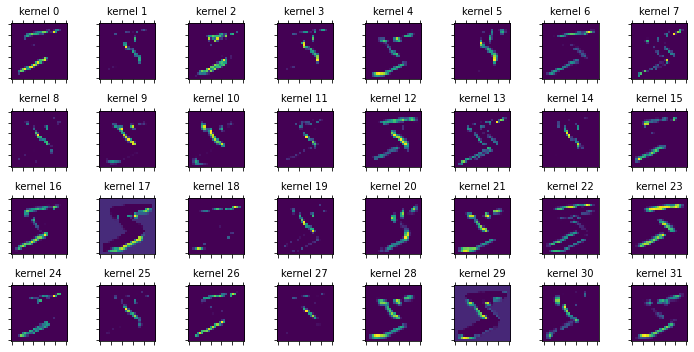

In [ ]:
# Convolution 시각화
fig, axes = plt.subplots(4, 8)
fig.set_size_inches(10, 5)

for i in range(32):
    axes[i//8, i%8].matshow(conv_activation[0, :, :, i], cmap='viridis')
    axes[i//8, i%8].set_title('kernel %s'%str(i), fontsize=10)
    plt.setp( axes[i//8, i%8].get_xticklabels(), visible=False)
    plt.setp( axes[i//8, i%8].get_yticklabels(), visible=False)

plt.tight_layout()
plt.show()

In [ ]:
# 두 번째 레이어(pool) 출력층 
pooling_activation = activations[1]
print(pooling_activation.shape)

(1, 13, 13, 32)


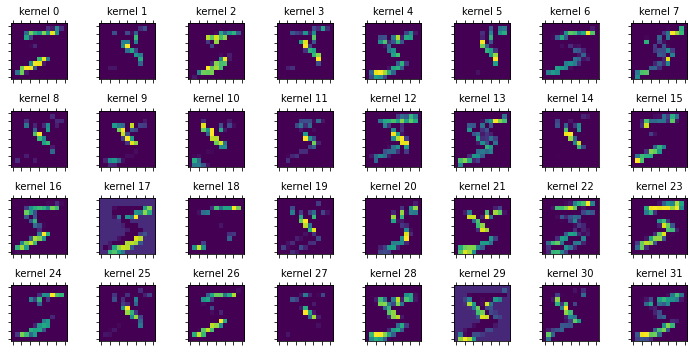

In [ ]:
# 시각화
fig, axes = plt.subplots(4, 8)
fig.set_size_inches(10, 5)

for i in range(32):
    axes[i//8, i%8].matshow(pooling_activation[0, :, :, i], cmap='viridis')
    axes[i//8, i%8].set_title('kernel %s'%str(i), fontsize=10)
    plt.setp( axes[i//8, i%8].get_xticklabels(), visible=False)
    plt.setp( axes[i//8, i%8].get_yticklabels(), visible=False)

plt.tight_layout()
plt.show()

## Data Augmentation

### Without Data Augmentation

#### Import

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import numpy as np
import matplotlib.pylab as plt

#### Dataset Load

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O cats_and_dogs_filtered.zip

--2022-06-30 05:54:32--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.62.128, 142.250.65.80, 142.250.188.208, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.62.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M   358MB/s    in 0.2s    

2022-06-30 05:54:32 (358 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [ ]:
!ls

cats_and_dogs_filtered.zip  sample_data


In [ ]:
import os
import zipfile

local_zip = 'cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('')
zip_ref.close()

In [ ]:
!ls

cats_and_dogs_filtered	cats_and_dogs_filtered.zip  sample_data


In [ ]:
!ls ./cats_and_dogs_filtered	

train  validation  vectorize.py


In [ ]:
# 훈련 셋, 검증 셋 저장위치 지정
train_dir = "cats_and_dogs_filtered/train"
valid_dir = "cats_and_dogs_filtered/validation"
print(train_dir)
print(valid_dir)

cats_and_dogs_filtered/train
cats_and_dogs_filtered/validation


#### Preprocessing

In [ ]:
# 이미지 데이터 제너레이터 정의 (Augmentation 미적용)
image_gen = ImageDataGenerator(rescale=(1/255.))
image_gen

In [ ]:
# flow_from_directory 함수로 폴더에서 이미지 가져와서 제너레이터 객체로 정리 
train_gen = image_gen.flow_from_directory(train_dir, 
                                          batch_size=32, 
                                          target_size=(224, 224),   
                                          classes=['cats','dogs'], 
                                          class_mode = 'binary',
                                          seed=2020)

valid_gen = image_gen.flow_from_directory(valid_dir,                                          
                                          batch_size=32, 
                                          target_size=(224, 224),   
                                          classes=['cats','dogs'], 
                                          class_mode = 'binary',
                                          seed=2020)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()


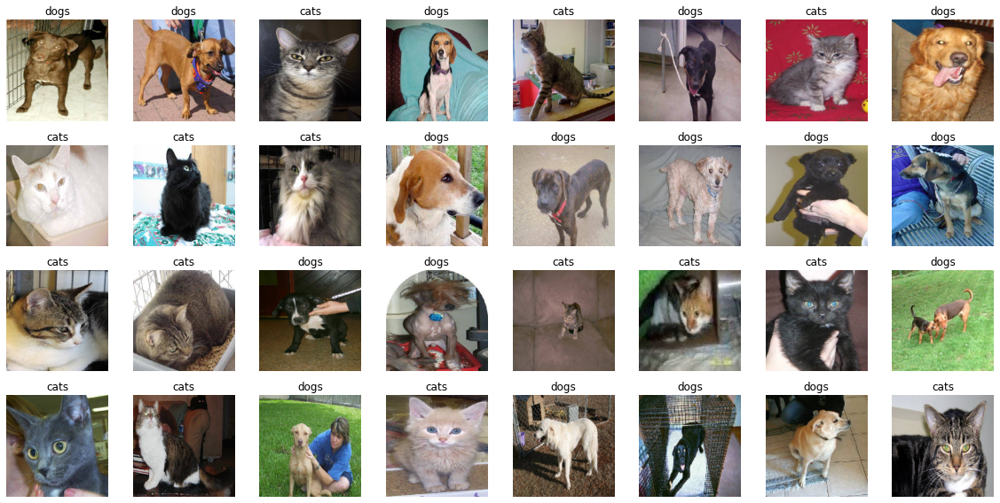

In [ ]:
# 샘플 이미지 출력
class_labels = ['cats', 'dogs']
batch = next(train_gen)
images, labels = batch[0], batch[1]

plt.figure(figsize=(16, 8))
for i in range(32):
    
    ax = plt.subplot(4, 8, i + 1)
    plt.imshow(images[i])
    plt.title(class_labels[labels[i].astype(np.int)])
    plt.axis("off")
plt.tight_layout()
plt.show()

#### Build Model

In [ ]:
# Sequential API를 사용하여 샘플 모델 생성

def build_model():

    model = tf.keras.Sequential([

        # Convolution 층 
        tf.keras.layers.Conv2D(32, (3, 3), padding='same'),        
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),

        tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),

        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),

        # Classifier 출력층 
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.Dropout(0.3),              
        tf.keras.layers.Dense(1, activation='sigmoid'),
    ])

    return model

model = build_model()

In [ ]:
# 모델 컴파일
model.compile(optimizer=tf.optimizers.Adam(lr=0.001), 
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), 
              metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


#### Training

In [ ]:
# 모델 훈련
history = model.fit(train_gen, validation_data=valid_gen, epochs=20)

Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


63/63 [==============================] - 13s 173ms/step - loss: 8.3987 - accuracy: 0.5765 - val_loss: 0.6886 - val_accuracy: 0.4990
Epoch 2/20
63/63 [==============================] - 10s 163ms/step - loss: 0.6494 - accuracy: 0.6835 - val_loss: 0.7015 - val_accuracy: 0.5000
Epoch 3/20
63/63 [==============================] - 10s 163ms/step - loss: 0.5319 - accuracy: 0.7330 - val_loss: 0.7629 - val_accuracy: 0.5020
Epoch 4/20
63/63 [==============================] - 10s 162ms/step - loss: 0.4852 - accuracy: 0.7670 - val_loss: 0.7063 - val_accuracy: 0.5140
Epoch 5/20
63/63 [==============================] - 10s 163ms/step - loss: 0.4152 - accuracy: 0.8205 - val_loss: 0.7318 - val_accuracy: 0.5330
Epoch 6/20
63/63 [==============================] - 10s 162ms/step - loss: 0.3728 - accuracy: 0.8405 - val_loss: 0.7389 - val_accuracy: 0.5480
Epoch 7/20
63/63 [==============================] - 10s 160ms/step - loss: 0.3433 - accuracy: 0.8470 - val_loss: 0.6112 - val_accuracy: 0.6490
Epoch 8/20

#### Evaluation

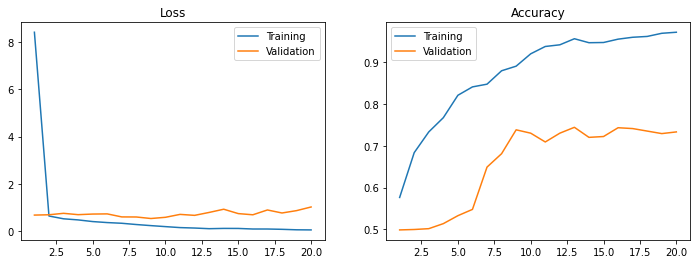

In [ ]:
# 손실함수, 정확도 그래프 그리기 
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 20)

### With Data Augmentation

#### Preprocessing

In [ ]:
# 이미지 데이터 제너레이터 정의 (Augmentation 적용)
image_gen_aug = ImageDataGenerator(rescale=1/255., 
                                   horizontal_flip=True,
                                   rotation_range=35,                                
                                   zoom_range=0.2)

# flow_from_directory 함수로 폴더에서 이미지 가져와서 제너레이터 객체로 정리 
train_gen_aug = image_gen_aug.flow_from_directory(train_dir, 
                                                  batch_size=32, 
                                                  target_size=(224,224),   
                                                  classes=['cats','dogs'], 
                                                  class_mode = 'binary', 
                                                  seed=2020)

valid_gen_aug = image_gen_aug.flow_from_directory(valid_dir,  
                                                  batch_size=32, 
                                                  target_size=(224,224),   
                                                  classes=['cats','dogs'], 
                                                  class_mode = 'binary', 
                                                  seed=2020)


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()


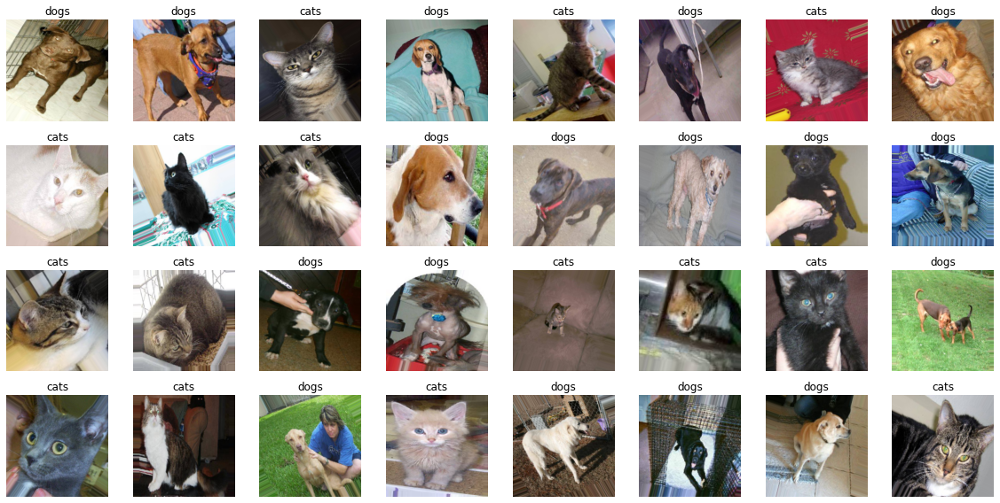

In [ ]:
# 샘플 이미지 출력
class_labels = ['cats', 'dogs']
batch = next(train_gen_aug)
images, labels = batch[0], batch[1]

plt.figure(figsize=(16, 8))
for i in range(32):
    
    ax = plt.subplot(4, 8, i + 1)
    plt.imshow(images[i])
    plt.title(class_labels[labels[i].astype(np.int)])
    plt.axis("off")
plt.tight_layout()
plt.show()

#### Build Model

In [ ]:
# 모델 생성
model_aug = build_model()

# 모델 컴파일
model_aug.compile(optimizer=tf.optimizers.Adam(),  
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), 
              metrics=['accuracy'])

#### Training

In [ ]:
# 모델 훈련
history_aug = model_aug.fit(train_gen_aug, validation_data=valid_gen_aug, epochs=40)

Epoch 1/40


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


63/63 [==============================] - 37s 583ms/step - loss: 7.3948 - accuracy: 0.5595 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/40
63/63 [==============================] - 37s 591ms/step - loss: 0.6392 - accuracy: 0.6165 - val_loss: 0.6994 - val_accuracy: 0.5000
Epoch 3/40
63/63 [==============================] - 36s 576ms/step - loss: 0.6203 - accuracy: 0.6305 - val_loss: 0.7339 - val_accuracy: 0.5000
Epoch 4/40
63/63 [==============================] - 36s 573ms/step - loss: 0.6020 - accuracy: 0.6375 - val_loss: 0.6863 - val_accuracy: 0.5380
Epoch 5/40
63/63 [==============================] - 36s 573ms/step - loss: 0.5963 - accuracy: 0.6555 - val_loss: 0.7248 - val_accuracy: 0.5080
Epoch 6/40
63/63 [==============================] - 36s 573ms/step - loss: 0.6069 - accuracy: 0.6565 - val_loss: 0.6638 - val_accuracy: 0.5870
Epoch 7/40
63/63 [==============================] - 36s 578ms/step - loss: 0.5778 - accuracy: 0.6665 - val_loss: 0.6132 - val_accuracy: 0.6420
Epoch 8/40

#### Evaluation

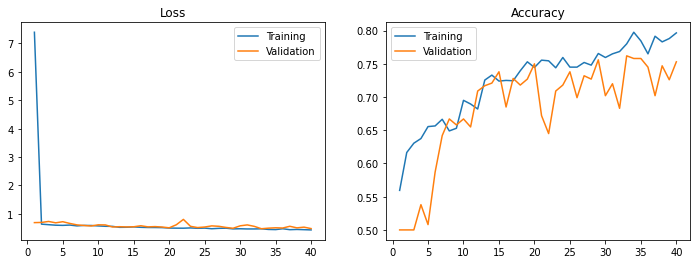

In [ ]:
# 손실함수, 정확도 그래프 그리기 
plot_loss_acc(history_aug, 40)

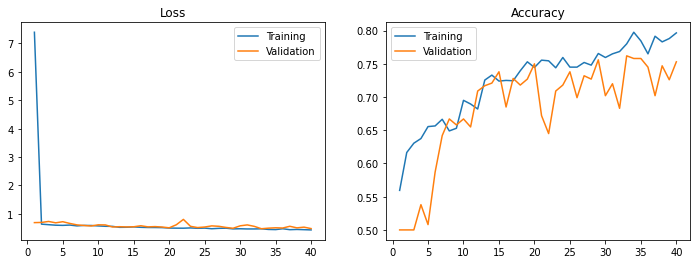

In [ ]:
# 손실함수, 정확도 그래프 그리기 
plot_loss_acc(history_aug, 40)

## Advanced Techniques - 모델 구조 

### Dataset Load

In [ ]:
import tensorflow as tf
import numpy as np

In [ ]:
# MNIST 손글씨 이미지 데이터 로드
mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_valid, y_valid) = mnist.load_data()

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


### Build Model

In [ ]:
# Functional API를 사용하여 모델 생성

inputs = tf.keras.layers.Input(shape=(28, 28, 1))

conv = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
pool = tf.keras.layers.MaxPooling2D((2, 2))(conv)
flat = tf.keras.layers.Flatten()(pool)

flat_inputs = tf.keras.layers.Flatten()(inputs)
concat = tf.keras.layers.Concatenate()([flat, flat_inputs])
outputs = tf.keras.layers.Dense(10, activation='softmax')(concat)

model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 26, 26, 32)   320         ['input_1[0][0]']                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 13, 13, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 flatten (Flatten)              (None, 5408)         0           ['max_pooling2d[0][0]']          
                                                                                              

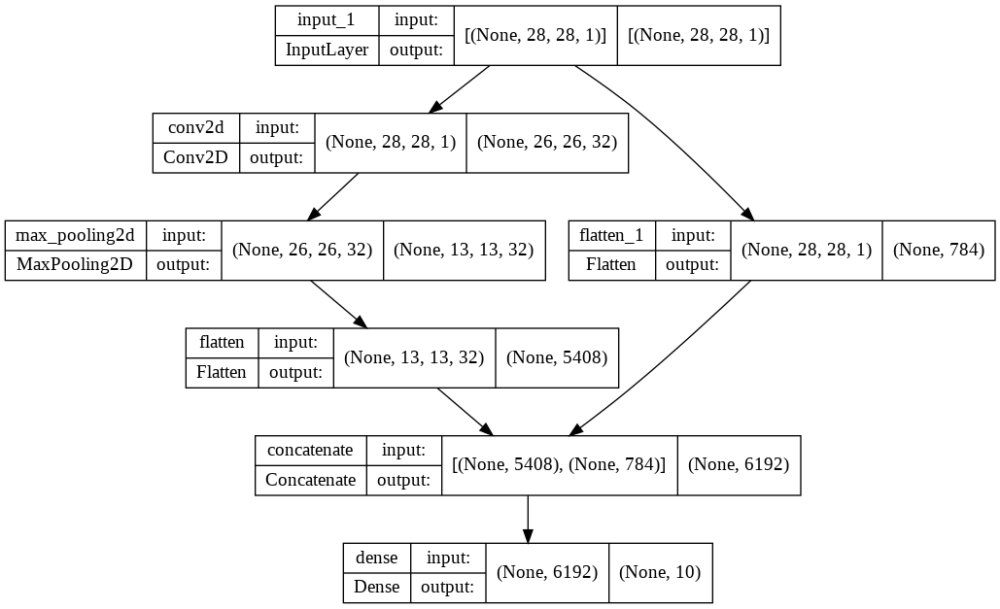

In [ ]:
# 모델 구조 출력 및 이미지 파일로 저장
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='functional_cnn.png')

In [ ]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


### Training

In [ ]:
# 모델 훈련
history = model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 32s 17ms/step - loss: 0.2114 - accuracy: 0.9398 - val_loss: 0.0890 - val_accuracy: 0.9734
Epoch 2/10
1875/1875 [==============================] - 31s 16ms/step - loss: 0.0827 - accuracy: 0.9761 - val_loss: 0.0688 - val_accuracy: 0.9773
Epoch 3/10
1875/1875 [==============================] - 30s 16ms/step - loss: 0.0614 - accuracy: 0.9819 - val_loss: 0.0618 - val_accuracy: 0.9793
Epoch 4/10
1875/1875 [==============================] - 33s 17ms/step - loss: 0.0497 - accuracy: 0.9851 - val_loss: 0.0541 - val_accuracy: 0.9818
Epoch 5/10
1875/1875 [==============================] - 34s 18ms/step - loss: 0.0416 - accuracy: 0.9872 - val_loss: 0.0625 - val_accuracy: 0.9789
Epoch 6/10
1875/1875 [==============================] - 34s 18ms/step - loss: 0.0352 - accuracy: 0.9890 - val_loss: 0.0652 - val_accuracy: 0.9807
Epoch 7/10
1875/1875 [==============================] - 32s 17ms/step - loss: 0.0296 - accuracy: 0.9906 - val_loss: 0.0569 -

### Evaluation

In [ ]:
# 모델 성능
val_loss, val_acc = model.evaluate(x_valid_in, y_valid)
print(val_loss, val_acc)

313/313 [==============================] - 2s 7ms/step - loss: 0.0616 - accuracy: 0.9831
0.06155535951256752 0.9830999970436096


### Advanced Technique - Multi Output 구조

### Preprocessing

In [ ]:
# 새로운 출력값 배열을 생성 (홀수: 1, 짝수: 0)
y_train_odd = []
for y in y_train:
    if y % 2==0:
        y_train_odd.append(0)
    else:
        y_train_odd.append(1)

y_train_odd = np.array(y_train_odd)
y_train_odd.shape

(60000,)

In [ ]:
# Validation 데이터셋 처리
y_valid_odd = []
for y in y_valid:
    if y % 2==0:
        y_valid_odd.append(0)
    else:
        y_valid_odd.append(1)

y_valid_odd = np.array(y_valid_odd)
y_valid_odd.shape

(10000,)

### Build Model

In [ ]:
# Functional API를 사용하여 모델 생성

inputs = tf.keras.layers.Input(shape=(28, 28, 1), name='inputs')

conv = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', name='conv2d_layer')(inputs)
pool = tf.keras.layers.MaxPooling2D((2, 2), name='maxpool_layer')(conv)
flat = tf.keras.layers.Flatten(name='flatten_layer')(pool)

flat_inputs = tf.keras.layers.Flatten()(inputs)
concat = tf.keras.layers.Concatenate()([flat, flat_inputs])
digit_outputs = tf.keras.layers.Dense(10, activation='softmax', name='digit_dense')(concat)

odd_outputs = tf.keras.layers.Dense(1, activation='sigmoid', name='odd_dense')(flat_inputs)

model = tf.keras.models.Model(inputs=inputs, outputs=[digit_outputs, odd_outputs])

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_layer (Conv2D)          (None, 26, 26, 32)   320         ['inputs[0][0]']                 
                                                                                                  
 maxpool_layer (MaxPooling2D)   (None, 13, 13, 32)   0           ['conv2d_layer[0][0]']           
                                                                                                  
 flatten_layer (Flatten)        (None, 5408)         0           ['maxpool_layer[0][0]']          
                                                                                            

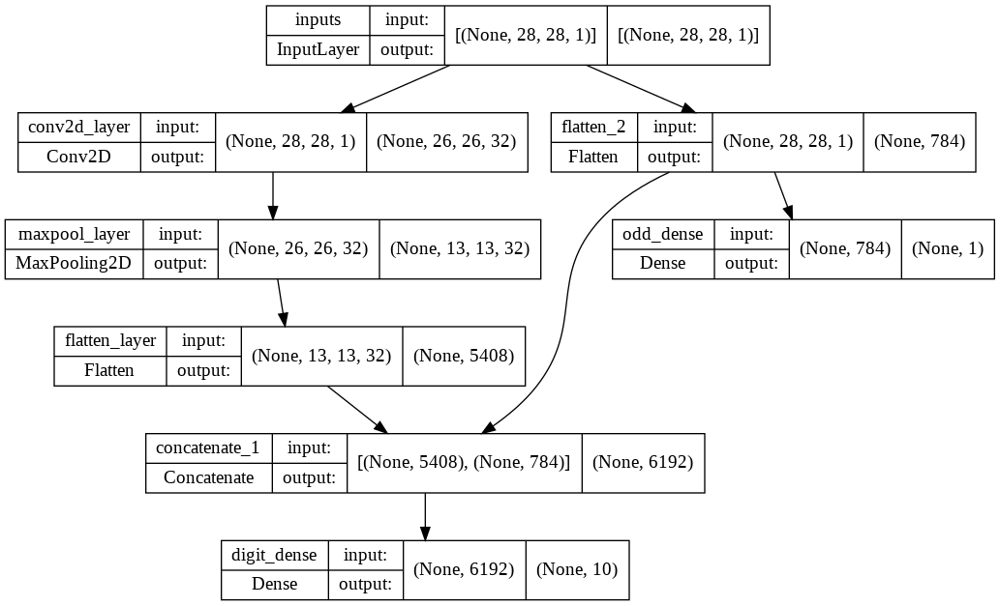

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True, to_file='multi_output_cnn.png')

In [ ]:
# 모델 컴파일
model.compile(optimizer='adam', 
              loss={'digit_dense': 'sparse_categorical_crossentropy', 'odd_dense': 'binary_crossentropy'}, 
              loss_weights={'digit_dense': 1, 'odd_dense': 0.5}, # loss = 1.0 *sparse_categorical_crossentropy + 0.5*binary_crossentropy
              metrics=['accuracy'])

### Training

In [ ]:

# 모델 훈련
history = model.fit({'inputs': x_train_in}, {'digit_dense': y_train, 'odd_dense': y_train_odd}, 
                    validation_data=({'inputs': x_valid_in},  {'digit_dense': y_valid, 'odd_dense': y_valid_odd}), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 34s 18ms/step - loss: 0.3662 - digit_dense_loss: 0.2020 - odd_dense_loss: 0.3285 - digit_dense_accuracy: 0.9426 - odd_dense_accuracy: 0.8625 - val_loss: 0.2246 - val_digit_dense_loss: 0.0871 - val_odd_dense_loss: 0.2749 - val_digit_dense_accuracy: 0.9730 - val_odd_dense_accuracy: 0.8898
Epoch 2/10
1875/1875 [==============================] - 31s 17ms/step - loss: 0.2159 - digit_dense_loss: 0.0801 - odd_dense_loss: 0.2717 - digit_dense_accuracy: 0.9764 - odd_dense_accuracy: 0.8916 - val_loss: 0.1960 - val_digit_dense_loss: 0.0640 - val_odd_dense_loss: 0.2640 - val_digit_dense_accuracy: 0.9806 - val_odd_dense_accuracy: 0.8973
Epoch 3/10
1875/1875 [==============================] - 31s 17ms/step - loss: 0.1923 - digit_dense_loss: 0.0609 - odd_dense_loss: 0.2630 - digit_dense_accuracy: 0.9812 - odd_dense_accuracy: 0.8957 - val_loss: 0.1860 - val_digit_dense_loss: 0.0565 - val_odd_dense_loss: 0.2590 - val_digit_dense_accuracy: 0.9814 -

### Evaluation

In [ ]:
# 모델 성능
model.evaluate({'inputs': x_valid_in}, {'digit_dense': y_valid, 'odd_dense': y_valid_odd})

313/313 [==============================] - 2s 6ms/step - loss: 0.1909 - digit_dense_loss: 0.0627 - odd_dense_loss: 0.2564 - digit_dense_accuracy: 0.9838 - odd_dense_accuracy: 0.9019


[0.19088611006736755,
 0.06268550455570221,
 0.2564011812210083,
 0.9837999939918518,
 0.9018999934196472]

7


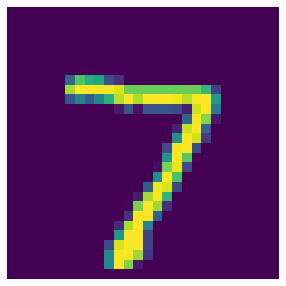

In [ ]:
# 샘플 이미지 출력
import matplotlib.pylab as plt

def plot_image(data, idx):
    plt.figure(figsize=(5, 5))
    plt.imshow(data[idx])
    plt.axis("off")
    plt.show()

print(y_valid[0])
plot_image(x_valid, 0)

In [ ]:
digit_preds, odd_preds = model.predict(x_valid_in)
print(digit_preds[0])
print(odd_preds[0])

[2.5122160e-14 1.7734646e-10 5.8853078e-10 4.5630150e-06 8.1126154e-13
 9.7225190e-13 1.4516928e-21 9.9999547e-01 2.3767679e-10 3.7517780e-09]
[0.9995494]


In [ ]:
digit_labels = np.argmax(digit_preds, axis=-1)
digit_labels[0:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])

In [ ]:
odd_labels = (odd_preds > 0.5).astype(np.int).reshape(1, -1)[0]
odd_labels[0:10]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """Entry point for launching an IPython kernel.


array([1, 0, 1, 0, 0, 1, 0, 1, 0, 1])

## Advanced Technique - Transfer Learning

In [ ]:
# 앞의 모델에서 flatten_layer 출력을 추출
base_model_output = model.get_layer('flatten_layer').output

# 앞의 출력을 출력으로 하는 모델 정의
base_model = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base')
base_model.summary()

Model: "base"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_layer (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 maxpool_layer (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 flatten_layer (Flatten)     (None, 5408)              0         
                                                                 
Total params: 320
Trainable params: 320
Non-trainable params: 0
_________________________________________________________________


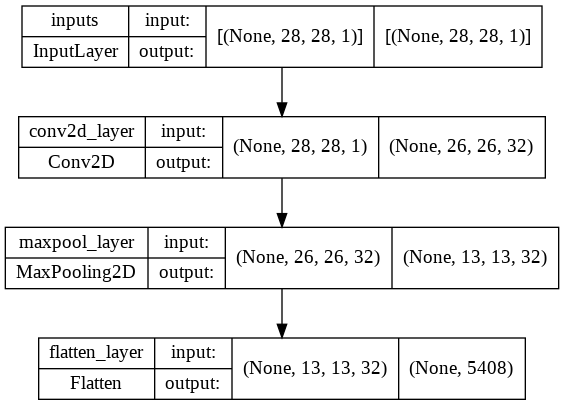

In [ ]:
plot_model(base_model, show_shapes=True, show_layer_names=True, to_file='base_model.png')

In [ ]:
# Sequential API 적용
digit_model = tf.keras.Sequential([
                                   base_model,
                                   tf.keras.layers.Dense(10, activation='softmax'),
                                   ])
digit_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base (Functional)           (None, 5408)              320       
                                                                 
 dense_2 (Dense)             (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


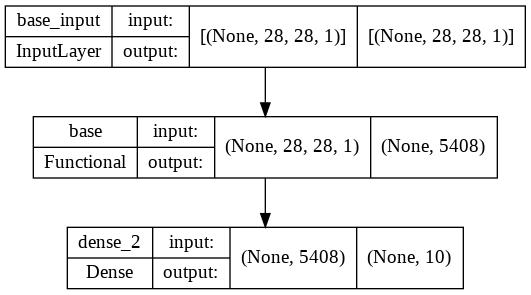

In [ ]:
plot_model(digit_model, show_shapes=True, show_layer_names=True, to_file='digit_model.png')


In [ ]:
# 모델 컴파일
digit_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 29s 15ms/step - loss: 0.1287 - accuracy: 0.9637 - val_loss: 0.0676 - val_accuracy: 0.9779
Epoch 2/10
1875/1875 [==============================] - 28s 15ms/step - loss: 0.0571 - accuracy: 0.9830 - val_loss: 0.0523 - val_accuracy: 0.9833
Epoch 3/10
1875/1875 [==============================] - 28s 15ms/step - loss: 0.0441 - accuracy: 0.9866 - val_loss: 0.0544 - val_accuracy: 0.9823
Epoch 4/10
1875/1875 [==============================] - 28s 15ms/step - loss: 0.0351 - accuracy: 0.9888 - val_loss: 0.0517 - val_accuracy: 0.9836
Epoch 5/10
1875/1875 [==============================] - 28s 15ms/step - loss: 0.0294 - accuracy: 0.9906 - val_loss: 0.0504 - val_accuracy: 0.9842
Epoch 6/10
1875/1875 [==============================] - 29s 15ms/step - loss: 0.0241 - accuracy: 0.9927 - val_loss: 0.0624 - val_accuracy: 0.9810
Epoch 7/10
1875/1875 [==============================] - 29s 15ms/step - loss: 0.0201 - accuracy: 0.9940 - val_loss: 0.0612 -

In [ ]:
# 베이스 모델의 가중치를 고정 (Freeze Model)

base_model_frozen = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base_frozen')
base_model_frozen.trainable = False
base_model_frozen.summary()

Model: "base_frozen"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_layer (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 maxpool_layer (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 flatten_layer (Flatten)     (None, 5408)              0         
                                                                 
Total params: 320
Trainable params: 0
Non-trainable params: 320
_________________________________________________________________


In [ ]:
# Functional API 적용
dense_output = tf.keras.layers.Dense(10, activation='softmax')(base_model_frozen.output)
digit_model_frozen = tf.keras.models.Model(inputs=base_model_frozen.input, outputs=dense_output)
digit_model_frozen.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_layer (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 maxpool_layer (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 flatten_layer (Flatten)     (None, 5408)              0         
                                                                 
 dense_5 (Dense)             (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,090
Non-trainable params: 320
_____________________________________________________

In [ ]:
# 모델 컴파일
digit_model_frozen.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model_frozen.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 16s 8ms/step - loss: 0.1170 - accuracy: 0.9693 - val_loss: 0.0566 - val_accuracy: 0.9826
Epoch 2/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0487 - accuracy: 0.9858 - val_loss: 0.0469 - val_accuracy: 0.9846
Epoch 3/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0358 - accuracy: 0.9893 - val_loss: 0.0483 - val_accuracy: 0.9845
Epoch 4/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0281 - accuracy: 0.9918 - val_loss: 0.0498 - val_accuracy: 0.9837
Epoch 5/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0216 - accuracy: 0.9934 - val_loss: 0.0545 - val_accuracy: 0.9823
Epoch 6/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0183 - accuracy: 0.9947 - val_loss: 0.0461 - val_accuracy: 0.9847
Epoch 7/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0149 - accuracy: 0.9956 - val_loss: 0.0541 - val_ac

In [ ]:
# 베이스 모델의 Conv2D 레이어의 가중치만 고정 (Freeze Layer)
base_model_frozen2 = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base_frozen2')
base_model_frozen2.get_layer('conv2d_layer').trainable = False
base_model_frozen2.summary()

Model: "base_frozen2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_layer (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 maxpool_layer (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 flatten_layer (Flatten)     (None, 5408)              0         
                                                                 
Total params: 320
Trainable params: 0
Non-trainable params: 320
_________________________________________________________________


In [ ]:
# Functional API 적용
dense_output2 = tf.keras.layers.Dense(10, activation='softmax')(base_model_frozen2.output)
digit_model_frozen2 = tf.keras.models.Model(inputs=base_model_frozen2.input, outputs=dense_output2)
digit_model_frozen2.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_layer (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 maxpool_layer (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 flatten_layer (Flatten)     (None, 5408)              0         
                                                                 
 dense_6 (Dense)             (None, 10)                54090     
                                                                 
Total params: 54,410
Trainable params: 54,090
Non-trainable params: 320
_____________________________________________________

In [ ]:
# 모델 컴파일
digit_model_frozen2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model_frozen2.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 14s 7ms/step - loss: 0.1153 - accuracy: 0.9698 - val_loss: 0.0572 - val_accuracy: 0.9814
Epoch 2/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0489 - accuracy: 0.9861 - val_loss: 0.0491 - val_accuracy: 0.9831
Epoch 3/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0355 - accuracy: 0.9896 - val_loss: 0.0495 - val_accuracy: 0.9844
Epoch 4/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0274 - accuracy: 0.9920 - val_loss: 0.0544 - val_accuracy: 0.9826
Epoch 5/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0225 - accuracy: 0.9927 - val_loss: 0.0467 - val_accuracy: 0.9840
Epoch 6/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0175 - accuracy: 0.9948 - val_loss: 0.0489 - val_accuracy: 0.9847
Epoch 7/10
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0148 - accuracy: 0.9958 - val_loss: 0.0554 - val_ac

# 딥러닝 14주차 강의
# 순환 신경망으로 IMDB 리뷰 분류하기

In [ ]:
# 실행마다 동일한 결과를 얻기 위해 케라스에 랜덤 시드를 사용하고 텐서플로 연산을 결정적으로 만듭니다. 
import tensorflow as tf

tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

## IMDB 리뷰 데이터셋

## Data Load

In [ ]:
from tensorflow.keras.datasets import imdb

(train_input, train_target), (test_input, test_target) = imdb.load_data(
    num_words=500)

17473536/17464789 [==============================] - 0s 0us/step


In [ ]:
print('훈련용 리뷰 개수 : {}'.format(len(train_input)))
print('테스트용 리뷰 개수 : {}'.format(len(test_input)))
num_classes = len(set(train_target))
print('카테고리 : {}'.format(num_classes))

훈련용 리뷰 개수 : 25000
테스트용 리뷰 개수 : 25000
카테고리 : 2


In [ ]:
print('첫번째 훈련용 리뷰 :',train_input[0])
print('첫번째 훈련용 리뷰의 레이블 :',train_target[0])

첫번째 훈련용 리뷰 : [1, 14, 22, 16, 43, 2, 2, 2, 2, 65, 458, 2, 66, 2, 4, 173, 36, 256, 5, 25, 100, 43, 2, 112, 50, 2, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 2, 2, 17, 2, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2, 19, 14, 22, 4, 2, 2, 469, 4, 22, 71, 87, 12, 16, 43, 2, 38, 76, 15, 13, 2, 4, 22, 17, 2, 17, 12, 16, 2, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2, 2, 16, 480, 66, 2, 33, 4, 130, 12, 16, 38, 2, 5, 25, 124, 51, 36, 135, 48, 25, 2, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 2, 15, 256, 4, 2, 7, 2, 5, 2, 36, 71, 43, 2, 476, 26, 400, 317, 46, 7, 4, 2, 2, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2, 56, 26, 141, 6, 194, 2, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 2, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 2, 88, 12, 16, 283, 5, 16, 2, 113, 103, 32, 15, 16, 2, 19, 178, 32]
첫번째 훈련용 리뷰의 레이블 : 1


In [ ]:
print(len(train_input[0]))

218


In [ ]:
print(len(train_input[1]))

189


In [ ]:
print(train_input[0])

[1, 14, 22, 16, 43, 2, 2, 2, 2, 65, 458, 2, 66, 2, 4, 173, 36, 256, 5, 25, 100, 43, 2, 112, 50, 2, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 2, 2, 17, 2, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2, 19, 14, 22, 4, 2, 2, 469, 4, 22, 71, 87, 12, 16, 43, 2, 38, 76, 15, 13, 2, 4, 22, 17, 2, 17, 12, 16, 2, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2, 2, 16, 480, 66, 2, 33, 4, 130, 12, 16, 38, 2, 5, 25, 124, 51, 36, 135, 48, 25, 2, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 2, 15, 256, 4, 2, 7, 2, 5, 2, 36, 71, 43, 2, 476, 26, 400, 317, 46, 7, 4, 2, 2, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2, 56, 26, 141, 6, 194, 2, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 2, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 2, 88, 12, 16, 283, 5, 16, 2, 113, 103, 32, 15, 16, 2, 19, 178, 32]


In [ ]:
print(train_target[:20])

[1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 1]


In [ ]:
from sklearn.model_selection import train_test_split

train_input, val_input, train_target, val_target = train_test_split(
    train_input, train_target, test_size=0.2, random_state=42)

In [ ]:
import numpy as np

lengths = np.array([len(x) for x in train_input])

리뷰의 최대 길이 : 1854
리뷰의 평균 길이 : 239.00925


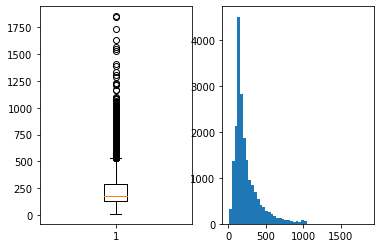

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

reviews_length = [len(review) for review in train_input]

print('리뷰의 최대 길이 : {}'.format(np.max(reviews_length)))
print('리뷰의 평균 길이 : {}'.format(np.mean(reviews_length)))

plt.subplot(1,2,1)
plt.boxplot(reviews_length)
plt.subplot(1,2,2)
plt.hist(lengths, bins=50)
plt.show()

## Preprocessing

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

train_seq = pad_sequences(train_input, maxlen=100)

In [ ]:
train_input.shape

(20000,)

In [ ]:
print(train_seq.shape)

(20000, 100)


In [ ]:
print(train_seq[0])

[ 10   4  20   9   2 364 352   5  45   6   2   2  33 269   8   2 142   2
   5   2  17  73  17 204   5   2  19  55   2   2  92  66 104  14  20  93
  76   2 151  33   4  58  12 188   2 151  12 215  69 224 142  73 237   6
   2   7   2   2 188   2 103  14  31  10  10 451   7   2   5   2  80  91
   2  30   2  34  14  20 151  50  26 131  49   2  84  46  50  37  80  79
   6   2  46   7  14  20  10  10 470 158]


In [ ]:
print(train_input[0][-10:])

[6, 2, 46, 7, 14, 20, 10, 10, 470, 158]


In [ ]:
print(train_seq[5])

[  0   0   0   0   1   2 195  19  49   2   2 190   4   2 352   2 183  10
  10  13  82  79   4   2  36  71 269   8   2  25  19  49   7   4   2   2
   2   2   2  10  10  48  25  40   2  11   2   2  40   2   2   5   4   2
   2  95  14 238  56 129   2  10  10  21   2  94 364 352   2   2  11 190
  24 484   2   7  94 205 405  10  10  87   2  34  49   2   7   2   2   2
   2   2 290   2  46  48  64  18   4   2]


In [ ]:
val_seq = pad_sequences(val_input, maxlen=100)

## Build RNN Model

In [ ]:
from tensorflow import keras

model = keras.Sequential()

model.add(keras.layers.SimpleRNN(8, input_shape=(100, 500)))
model.add(keras.layers.Dense(1, activation='sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 8)                 4072      
                                                                 
 dense (Dense)               (None, 1)                 9         
                                                                 
Total params: 4,081
Trainable params: 4,081
Non-trainable params: 0
_________________________________________________________________


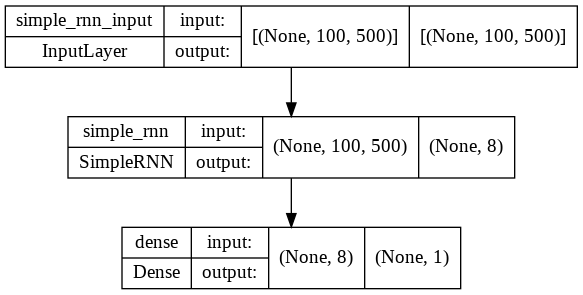

In [ ]:
tf.keras.utils.plot_model(model,  show_shapes=True)

In [ ]:
train_oh = keras.utils.to_categorical(train_seq)

In [ ]:
print(train_oh.shape)

(20000, 100, 500)


In [ ]:
print(train_oh[0][0][:12])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


In [ ]:
print(np.sum(train_oh[0][0]))

1.0


In [ ]:
val_oh = keras.utils.to_categorical(val_seq)

## Training

In [ ]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model.compile(optimizer=rmsprop, loss='binary_crossentropy', 
              metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-simplernn-model.h5', 
                                                save_best_only=True)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model.fit(train_oh, train_target, epochs=100, batch_size=64,
                    validation_data=(val_oh, val_target),
                    callbacks=[checkpoint_cb, early_stopping_cb])

2022-05-19 01:29:41.697697: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 4000000000 exceeds 10% of free system memory.
2022-05-19 01:29:45.305189: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 4000000000 exceeds 10% of free system memory.


Epoch 1/100
313/313 [==============================] - 16s 49ms/step - loss: 0.6989 - accuracy: 0.5041 - val_loss: 0.6978 - val_accuracy: 0.5038
Epoch 2/100
313/313 [==============================] - 13s 40ms/step - loss: 0.6946 - accuracy: 0.5102 - val_loss: 0.6949 - val_accuracy: 0.5102
Epoch 3/100
313/313 [==============================] - 12s 39ms/step - loss: 0.6920 - accuracy: 0.5200 - val_loss: 0.6930 - val_accuracy: 0.5146
Epoch 4/100
313/313 [==============================] - 12s 39ms/step - loss: 0.6901 - accuracy: 0.5302 - val_loss: 0.6916 - val_accuracy: 0.5230
Epoch 5/100
313/313 [==============================] - 13s 41ms/step - loss: 0.6883 - accuracy: 0.5408 - val_loss: 0.6905 - val_accuracy: 0.5270
Epoch 6/100
313/313 [==============================] - 12s 40ms/step - loss: 0.6866 - accuracy: 0.5472 - val_loss: 0.6894 - val_accuracy: 0.5356
Epoch 7/100
313/313 [==============================] - 13s 41ms/step - loss: 0.6845 - accuracy: 0.5563 - val_loss: 0.6880 - val_ac

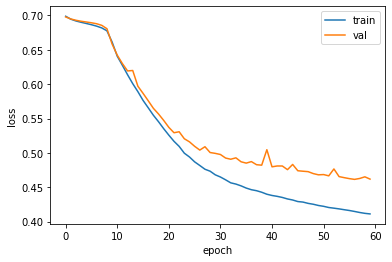

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

# 딥러닝 15주차 강의 1
# Autoencoder로 Fasion mnist 데이터 복원하기

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model


## Data Load

In [ ]:
(x_train, _), (x_test, _) = fashion_mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.


In [ ]:
print (x_train.shape)
print (x_test.shape)

(60000, 28, 28)
(10000, 28, 28)


## Build Autoencoder Model

In [ ]:
latent_dim = 64 

class Autoencoder(Model):
  def __init__(self, encoding_dim):
    super(Autoencoder, self).__init__()
    self.latent_dim = latent_dim   
    self.encoder = tf.keras.Sequential([
      layers.Flatten(),
      layers.Dense(latent_dim, activation='relu'),
    ])
    self.decoder = tf.keras.Sequential([
      layers.Dense(784, activation='sigmoid'),
      layers.Reshape((28, 28))
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder = Autoencoder(latent_dim)

In [ ]:
autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())

## Training

In [ ]:
autoencoder.fit(x_train, x_train,
                epochs=10,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/10
1875/1875 [==============================] - 7s 3ms/step - loss: 0.0242 - val_loss: 0.0133
Epoch 2/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0116 - val_loss: 0.0108
Epoch 3/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0101 - val_loss: 0.0098
Epoch 4/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0095 - val_loss: 0.0094
Epoch 5/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0092 - val_loss: 0.0092
Epoch 6/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 7/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0090 - val_loss: 0.0090
Epoch 8/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0089 - val_loss: 0.0091
Epoch 9/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0088 - val_loss: 0.0089
Epoch 10/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.008

## Evaluation

In [ ]:
encoded_imgs = autoencoder.encoder(x_test).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

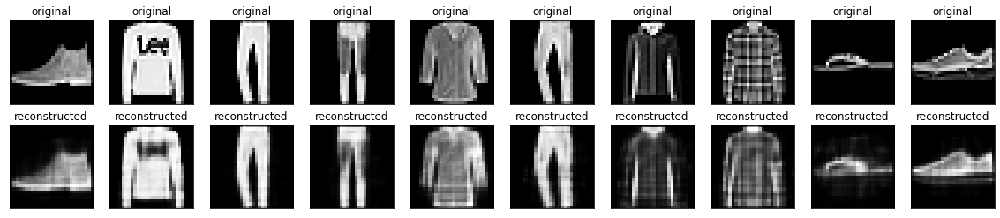

In [ ]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
  # display original
  ax = plt.subplot(2, n, i + 1)
  plt.imshow(x_test[i])
  plt.title("original")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  # display reconstruction
  ax = plt.subplot(2, n, i + 1 + n)
  plt.imshow(decoded_imgs[i])
  plt.title("reconstructed")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()

# 딥러닝 15주차 강의 2
#  Denoising Convolution Autoencoder 로 Image Noise 제거

## Data Load

In [ ]:
(x_train, _), (x_test, _) = fashion_mnist.load_data()

## Preprocessing

In [ ]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.

x_train = x_train[..., tf.newaxis]
x_test = x_test[..., tf.newaxis]

print(x_train.shape)

(60000, 28, 28, 1)


In [ ]:
noise_factor = 0.2
x_train_noisy = x_train + noise_factor * tf.random.normal(shape=x_train.shape) 
x_test_noisy = x_test + noise_factor * tf.random.normal(shape=x_test.shape) 

x_train_noisy = tf.clip_by_value(x_train_noisy, clip_value_min=0., clip_value_max=1.)
x_test_noisy = tf.clip_by_value(x_test_noisy, clip_value_min=0., clip_value_max=1.)

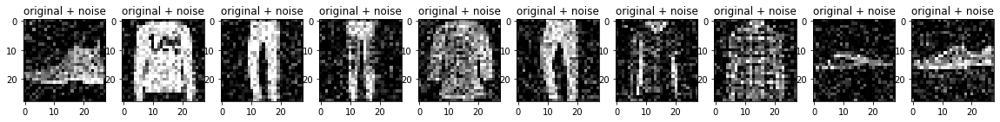

In [ ]:
n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i + 1)
    plt.title("original + noise")
    plt.imshow(tf.squeeze(x_test_noisy[i]))
    plt.gray()
plt.show()

## Build Convolution Autoencoder

In [ ]:
class Denoise(Model):
  def __init__(self):
    super(Denoise, self).__init__()
    self.encoder = tf.keras.Sequential([
      layers.Input(shape=(28, 28, 1)), 
      layers.Conv2D(16, (3,3), activation='relu', padding='same', strides=2),
      layers.Conv2D(8, (3,3), activation='relu', padding='same', strides=2)])

    self.decoder = tf.keras.Sequential([
      layers.Conv2DTranspose(8, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(16, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2D(1, kernel_size=(3,3), activation='sigmoid', padding='same')])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder = Denoise()

In [ ]:
autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())

## Training

In [ ]:
autoencoder.fit(x_train_noisy, x_train,
                epochs=10,
                shuffle=True,
                validation_data=(x_test_noisy, x_test))

Epoch 1/10
1875/1875 [==============================] - 73s 38ms/step - loss: 0.0171 - val_loss: 0.0096
Epoch 2/10
1875/1875 [==============================] - 61s 33ms/step - loss: 0.0089 - val_loss: 0.0084
Epoch 3/10
1875/1875 [==============================] - 61s 32ms/step - loss: 0.0079 - val_loss: 0.0077
Epoch 4/10
1875/1875 [==============================] - 62s 33ms/step - loss: 0.0076 - val_loss: 0.0076
Epoch 5/10
1875/1875 [==============================] - 61s 33ms/step - loss: 0.0074 - val_loss: 0.0074
Epoch 6/10
1875/1875 [==============================] - 61s 32ms/step - loss: 0.0073 - val_loss: 0.0073
Epoch 7/10
1875/1875 [==============================] - 61s 33ms/step - loss: 0.0072 - val_loss: 0.0072
Epoch 8/10
1875/1875 [==============================] - 61s 33ms/step - loss: 0.0071 - val_loss: 0.0071
Epoch 9/10
1875/1875 [==============================] - 62s 33ms/step - loss: 0.0071 - val_loss: 0.0070
Epoch 10/10
1875/1875 [==============================] - 61s 33m

## Evaluation

In [ ]:
autoencoder.encoder.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 16)        160       
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 8)           1160      
                                                                 
Total params: 1,320
Trainable params: 1,320
Non-trainable params: 0
_________________________________________________________________


In [ ]:
autoencoder.decoder.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose (Conv2DTra  (None, 14, 14, 8)        584       
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 28, 28, 16)       1168      
 ranspose)                                                       
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 1)         145       
                                                                 
Total params: 1,897
Trainable params: 1,897
Non-trainable params: 0
_________________________________________________________________


In [ ]:
encoded_imgs = autoencoder.encoder(x_test).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

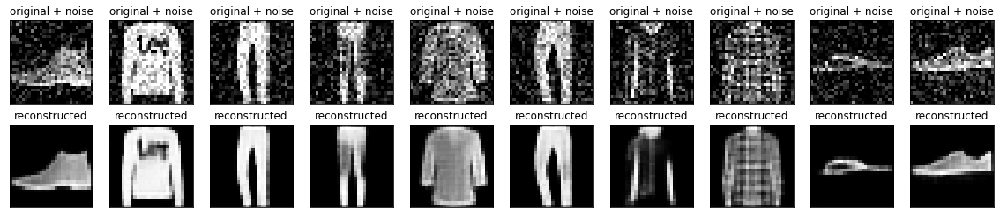

In [ ]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(n):

    # display original + noise
    ax = plt.subplot(2, n, i + 1)
    plt.title("original + noise")
    plt.imshow(tf.squeeze(x_test_noisy[i]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    bx = plt.subplot(2, n, i + n + 1)
    plt.title("reconstructed")
    plt.imshow(tf.squeeze(decoded_imgs[i]))
    plt.gray()
    bx.get_xaxis().set_visible(False)
    bx.get_yaxis().set_visible(False)
plt.show()